In [ ]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
%config InlineBackend.figure_format='retina'

import matplotlib as mpl
mpl.rc("font", family='AppleGothic')
mpl.rc('axes', unicode_minus=False)

/var/folders/0p/k705g0x102v0x_kgxydj12kc0000gn/T/ipykernel_66030/919282783.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


### 라이브러리

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import datetime
from datetime import date
from statsmodels.tsa.seasonal import seasonal_decompose
import scipy.stats as stats

### 함수

In [ ]:
def plot_decompose(decomposeresult):
    fig, axes = plt.subplots(2,2, figsize = (25,8))
    decomposeresult.observed.plot(legend=False, ax=axes[0][0])
    axes[0][0].set_ylabel('Observed')
    decomposeresult.trend.plot(legend=False, ax=axes[0][1])
    axes[0][1].set_ylabel('Trend')
    decomposeresult.seasonal.plot(legend=False, ax=axes[1][0])
    axes[1][0].set_ylabel('Seasonal')
    decomposeresult.resid.plot(legend=False, ax=axes[1][1])
    axes[1][1].set_ylabel('Residual')

In [ ]:
weekdays = ['월', '화', '수', '목', '금', '토', '일']

def dayof_week(data):
    for indexs in data.index:
        data.loc[indexs, '요일'] = weekdays[indexs.weekday()]
    return data

In [ ]:
def division_weekend(data):
    for indexs in data.index:
        if (weekdays[indexs.weekday()] == '토') | (weekdays[indexs.weekday()] == '일'):
            data.loc[indexs, 'week'] = '주말'
        else:
            data.loc[indexs, 'week'] = '평일'
    return data

### 데이터

1. back_hospital.csv
    * 서울백병원·렉스소프트(주)
   

In [ ]:
df_h = pd.read_csv('/Users/simcheol-u/Desktop/빅_데이터_콘테스트/data/분석/back_hospital.csv')
df_h.drop(columns=['Unnamed: 0'], inplace=True)
df_h['back_hospital.yyyymmdd'] = df_h['back_hospital.yyyymmdd'].apply(str)
df_h['back_hospital.yyyymmdd'] = pd.to_datetime(df_h['back_hospital.yyyymmdd'], format="%Y/%m/%d")
df_h.set_index(['back_hospital.yyyymmdd'], drop=True)
df_h = df_h.set_index(['back_hospital.yyyymmdd'], drop=True)

print(df_h.shape)
df_h.head()

(49674, 3)


,back_hospital.area,back_hospital.sex,back_hospital.frequency
back_hospital.yyyymmdd,,,
2012-01-01,강원,1,3
2012-01-01,강원,2,3
2012-01-01,경기,1,4
2012-01-01,경기,2,5
2012-01-01,경남,1,2


 2. 행정구역_시군구_별__성별_인구수.csv
    * kosis 국가통계포털

In [ ]:
df_pop = pd.read_csv('/Users/simcheol-u/Desktop/빅_데이터_콘테스트/data/분석/행정구역_시군구_별__성별_인구수.csv', encoding='euc-kr')
df_pop.drop(index=0, inplace=True)
df_pop['행정구역(시군구)별'] = ['전국', '서울', '부산', '대구', '인천', '광주', '대전', '울산', '세종', '경기', '강원', '충북', '충남', '전북', '전남', '경북', '경남', '제주']
df_pop.set_index(['행정구역(시군구)별'], inplace=True)

for col in df_pop.columns:
    df_pop[col] = pd.to_numeric(df_pop[col])

print(df_pop.shape)
df_pop.head()

(18, 12)


,2012,2012.1,2012.2,2013,2013.1,2013.2,2014,2014.1,2014.2,2015,2015.1,2015.2
행정구역(시군구)별,,,,,,,,,,,,
전국,50948272,25504060,25444212,51141463,25588336,25553127,51327916,25669296,25658620,51529338,25758186,25771152
서울,10195318,5041336,5153982,10143645,5007869,5135776,10103233,4979768,5123465,10022181,4930943,5091238
부산,3538484,1754479,1784005,3527635,1747000,1780635,3519401,1740417,1778984,3513777,1735570,1778207
대구,2505644,1249320,1256324,2501588,1246071,1255517,2493264,1241119,1252145,2487829,1237291,1250538
인천,2843981,1431593,1412388,2879782,1448835,1430947,2902608,1459074,1443534,2925815,1469869,1455946


3. 종관관측.csv
    * 기상청_지상(종관, ASOS) 일자료 조회서비스

In [ ]:
df_aos = pd.read_csv('/Users/simcheol-u/Desktop/빅_데이터_콘테스트/data/분석/종관관측.csv')
df_aos = df_aos.drop(columns=['Unnamed: 0', 'stnId'])
df_aos['back_hospital.yyyymmdd'] = pd.to_datetime(df_aos['back_hospital.yyyymmdd'], format="%Y/%m/%d")
df_aos.sort_values(by=['back_hospital.area', 'back_hospital.yyyymmdd'], inplace=True)
df_aos.reset_index(drop=True, inplace=True)

In [ ]:
# 결측치 처리
# 결측치 앞 뒤 일자가 None이 아니라면, 앞 뒤 두 일자의 평균으로 대체함
# 2일 초과 연속적으로 결측치가 있는 날은 확인 되지 않기 때문에 남은 결측치는 앞, 뒤 일자의 데이터로 대체

for col in df_aos.columns[2:]:
    for nulldex in df_aos[df_aos[col].isnull()].index:
        start = df_aos.loc[nulldex-1, col]
        end = df_aos.loc[nulldex+1, col]
        if (start != None) & (end != None):
            df_aos.loc[nulldex, col] = (start + end / 2)

df_aos = df_aos.fillna(method='pad')
df_aos = df_aos.fillna(method='bfill')
df_aos = df_aos.set_index(['back_hospital.yyyymmdd'], drop=True)

# 요일 부여
dayof_week(df_aos)
division_weekend(df_aos)

print(df_aos.shape)
df_aos.head()

(49674, 34)


,back_hospital.area,back_hospital.sex,back_hospital.frequency,avgTa,minTa,minTaHrmt,maxTa,maxTaHrmt,maxInsWs,maxInsWsWd,...,maxPsHrmt,minPs,minPsHrmt,avgPs,ssDur,sumSsHr,avgTs,minTg,요일,week
back_hospital.yyyymmdd,,,,,,,,,,,,,,,,,,,,,
2012-01-01,강원,1,3,-2.576923,-6.607692,1880.692308,1.553846,1228.846154,9.084615,266.923077,...,2161.538462,1019.353846,1402.538462,1022.976923,9.623077,3.707692,-1.976923,-9.946154,일,주말
2012-01-01,강원,2,3,-2.576923,-6.607692,1880.692308,1.553846,1228.846154,9.084615,266.923077,...,2161.538462,1019.353846,1402.538462,1022.976923,9.623077,3.707692,-1.976923,-9.946154,일,주말
2012-01-02,강원,1,2,-4.784615,-9.376923,828.923077,0.876923,1420.384615,5.876923,253.846154,...,867.538462,1023.200000,1746.307692,1025.615385,9.615385,5.900000,-2.838462,-11.676923,월,평일
2012-01-02,강원,2,0,-4.784615,-9.376923,828.923077,0.876923,1420.384615,5.876923,253.846154,...,867.538462,1023.200000,1746.307692,1025.615385,9.615385,5.900000,-2.838462,-11.676923,월,평일
2012-01-03,강원,1,0,-4.538462,-9.261538,606.384615,0.692308,1405.307692,8.946154,279.230769,...,211.000000,1017.146154,1571.769231,1020.569231,9.638462,5.330769,-2.900000,-11.507692,화,평일


### 시계열 분해법을 이용한 심뇌혈관 질환 입원 분석(전지역)

* 성별, 지역 구분 없이 1달을 구간으로 나누어, 평균 심뇌혈관 질환으로 인한 입원 환자수 분석
        
        * Trend
        점진적으로 심뇌혈관 질환인한 입원 환자수가 증가 하고 있음
        * seasonal
        1월부터 시작, 입원 환자수가 상대적으로 많으며, 3월 기준으로 소폭 하락 함.
        4월에는 다시 소폭 상승 하였다가 5월 기준 대폭 하락함.
        6월에는 상승세가 주춤하다 7월 기준으로 상승하고, 9월 기준으로 밑바닥을 찍고, 11월 이후 대폭 상승함.
        
        11에서 4월, 6에서 8월 구간으로 입원 환자 수가 증가하고
        5월, 9에서 10월 구간으로 입원 환자 수가 감소하는 계절성을 보인다.

In [ ]:
# 1달 간격의 전지역 심뇌혈관 질환으로 인한 입원 환자수 평균
mean_day_h = df_h.resample('M').mean()
mean_day_h.head()

,back_hospital.sex,back_hospital.frequency
back_hospital.yyyymmdd,,
2012-01-31,1.5,1.423150
2012-02-29,1.5,1.443205
2012-03-31,1.5,1.416509
2012-04-30,1.5,1.403922
2012-05-31,1.5,1.425047


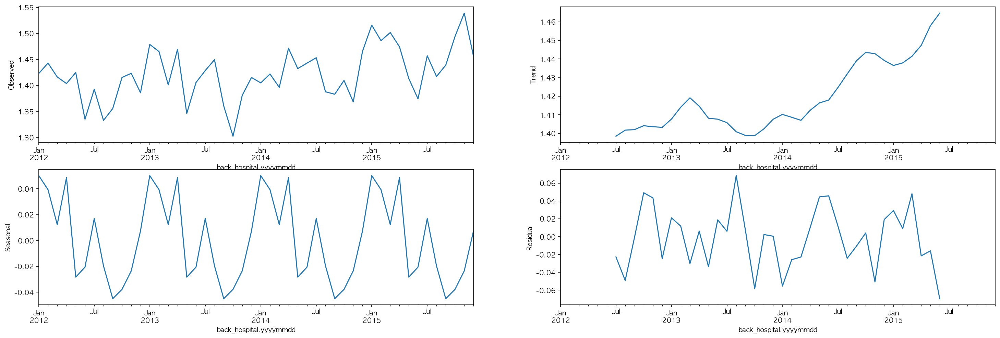

In [ ]:
# 시계열 분해
seasonal_month_h = seasonal_decompose(mean_day_h['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_month_h)

### 요일에 따른 입원 환자 수 경향
* 성별, 지역 구분 없이 각 일자에 따른, 심뇌혈관 질환으로 인한 입원 환자수 합

        평균적으로 월, 화, 수, 목, 금, 토, 일 순으로 심뇌혈관 질환으로 인한 일별 입원 환자수가 많았음
        입원 환자수 상위 100일 중 '월'요일이 가장 큰 비중을 차지함
        입원 환자수 하위 100일 중 '일'요일이 가장 큰 비중을 차지함
        
        평일, 주말로 구분하여 입원 환자수가 많은 순으로 정렬 하였을 때, 모두 1일 자가 상위에 위치하는 형태를 볼 수 있다.
        
        !~
        요일별 분석을 하였을 때, 기상의 요인 또는 계절성을 고려 하지 않음에도 불구하고, 외적요인에 의해 규칙성을 띈다는 것을 확인 할 수 있었다.
        주말에는 일반적으로 입원 절차가 응급실을 통해 이루어진다. 따라서 주말에 입원한 환자는 심뇌혈관 질환이 치명적으로 발생하여 입원한 것으로 가정

In [ ]:
# 데이터 전처리
sum_day_h = df_h.resample('D').sum()
sum_day_h.drop(columns='back_hospital.sex', inplace=True)
dayof_week(sum_day_h)
division_weekend(sum_day_h)
sum_day_h.head()

,back_hospital.frequency,요일,week
back_hospital.yyyymmdd,,,
2012-01-01,73,일,주말
2012-01-02,65,월,평일
2012-01-03,50,화,평일
2012-01-04,52,수,평일
2012-01-05,63,목,평일


In [ ]:
# 일별 입원 환자수 합의 요일별 평균
sum_day_h.groupby(by='요일').mean().sort_values(by='back_hospital.frequency', ascending=False)

,back_hospital.frequency
요일,
월,59.153110
화,52.755981
수,52.062201
목,49.483254
금,47.250000
토,39.519231
일,38.205742


In [ ]:
print('일별 입원 환자수 상위 100일의 요일 집계')
sum_day_h.sort_values(by='back_hospital.frequency', ascending=False).head(100).value_counts('요일')

일별 입원 환자수 상위 100일의 요일 집계


요일
월    42
수    16
화    15
금     8
목     8
일     6
토     5
dtype: int64

In [ ]:
print('일별 입원 환자수 하위 100일의 요일 집계')
sum_day_h.sort_values(by='back_hospital.frequency', ascending=True).head(100).value_counts('요일')

일별 입원 환자수 하위 100일의 요일 집계


요일
일    53
토    31
금     7
목     3
수     3
화     2
월     1
dtype: int64

In [ ]:
# 평일 입원 환자가 많은 순
sum_day_h.query('week.str.contains("평일")', engine='python').sort_values(by='back_hospital.frequency', ascending=False).head(30)

,back_hospital.frequency,요일,week
back_hospital.yyyymmdd,,,
2014-12-01,111,월,평일
2015-06-01,108,월,평일
2015-01-01,105,목,평일
2013-04-01,102,월,평일
2012-02-01,101,수,평일
2015-12-01,97,화,평일
2014-04-01,96,화,평일
2013-07-01,93,월,평일
2014-09-01,93,월,평일


In [ ]:
# 주말 입원 환자가 많은 순
sum_day_h.query('week.str.contains("주말")', engine='python').sort_values(by='back_hospital.frequency', ascending=False).head(30)

,back_hospital.frequency,요일,week
back_hospital.yyyymmdd,,,
2015-02-01,87,일,주말
2014-02-01,82,토,주말
2012-07-01,79,일,주말
2014-06-01,79,일,주말
2014-11-01,77,토,주말
2013-12-01,74,일,주말
2012-01-01,73,일,주말
2012-12-01,72,토,주말
2013-06-01,70,토,주말


### 기상요인과 일일 심뇌혈관 입원 환자 수의 상관관계 분석(전지역)
* 지역 구분 없이 '주말'에 해당 되는 기상요소와 입원 환자수의 상관관계
        
        '습도', '풍속', '기압', '기온'과의 상관관계가 있다고 확인됨

In [ ]:
# 기존 aos 데이터 중 '주말'
df_aos_corr = df_aos.copy()

df_aos_corr_weekend = df_aos_corr.query("week == '주말'", engine='python')

* 아하


In [ ]:
# 주말, 입원 환자수와 기상요인의 피어슨 상관계수 계산

df_aos_corr2 = pd.DataFrame()

for col in df_aos_corr_weekend.columns[1:32]:
        df_aos_corr2.loc[col, 'corr'] = stats.pearsonr(df_aos_corr_weekend['back_hospital.frequency'], df_aos_corr_weekend[col])[0]
        df_aos_corr2.loc[col, 'p_value'] = stats.pearsonr(df_aos_corr_weekend['back_hospital.frequency'], df_aos_corr_weekend[col])[1]

In [ ]:
# p-value 0.05 기준으로 유의하다고 판단 되는 기상 요소
df_aos_corr2[df_aos_corr2['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000e+00
avgRhm,-0.074808,4.694338e-19
minRhm,-0.072977,3.309901e-18
maxWsWd,0.052899,2.927566e-10
avgTd,-0.049301,4.269689e-09
hr24SumRws,-0.047848,1.197774e-08
avgWs,-0.047817,1.224025e-08
maxInsWsWd,0.045050,8.029124e-08
maxWs,-0.043386,2.365965e-07
maxWsHrmt,0.040078,1.809061e-06


### 2012~2015 인구 대비 평균 입원 환자의 비율
* 지역 인구수 대비 지역별 입원 환자 비율
        
        색이 진할수록 입원 환자수가 많은 지역
![image.png](attachment:image.png)



In [ ]:
df_area_rate = pd.DataFrame()
i = 0

for area in df_h['back_hospital.area'].unique():
    a = df_h.loc[df_h['back_hospital.area'] == area, 'back_hospital.frequency'].sum()
    b = df_pop.iloc[df_pop.index == area, [0, 3, 6, 9]].sum(axis=1)
    df_area_rate.loc[i, 'area'] = area
    df_area_rate.loc[i, 'rate'] =  (a / b)[0]
    i += 1
    
df_area_rate['rate'] = pd.to_numeric(df_area_rate['rate'])

In [ ]:
df_area_rate.sort_values(by=['rate'], ascending=False)

,area,rate
12,전남,0.000594
3,경북,0.000520
13,전북,0.000509
0,강원,0.000497
16,충북,0.000460
2,경남,0.000447
15,충남,0.000389
7,부산,0.000365
4,광주,0.000361
5,대구,0.000337


### 지역 분석 '강원'

In [ ]:
강원 = df_aos[df_aos['back_hospital.area'] == '강원']
강원_주말 = 강원[강원['week'] == '주말']
강원_평일 = 강원[강원['week'] == '평일']

강원 = 강원.resample('M').mean()
강원_평일 = 강원_평일.resample('M').mean()
강원_주말 = 강원_주말.resample('M').mean()

강원.describe()

,back_hospital.sex,back_hospital.frequency,avgTa,minTa,minTaHrmt,maxTa,maxTaHrmt,maxInsWs,maxInsWsWd,maxInsWsHrmt,...,avgPa,maxPs,maxPsHrmt,minPs,minPsHrmt,avgPs,ssDur,sumSsHr,avgTs,minTg
count,48.0,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,...,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,1.5,1.050564,11.313733,6.497151,936.014075,16.784561,1332.547713,7.955176,209.224774,1315.002900,...,989.445530,1019.034896,1170.954750,1012.880518,1271.557392,1015.937311,12.194434,6.234784,13.314830,4.216776
std,0.0,0.126584,9.794266,10.159870,103.997749,9.758295,42.477722,1.101946,23.348536,59.826766,...,5.485323,6.932217,102.936020,6.232925,97.104122,6.565127,1.788719,1.236370,10.796600,10.707657
min,1.5,0.683333,-4.712903,-9.719107,698.530769,0.818362,1181.966667,6.081538,165.334988,1153.776675,...,979.875931,1007.006700,956.725641,1002.585360,1037.307692,1004.677419,9.618610,2.868974,-2.646650,-11.305040
25%,1.5,1.000000,3.190757,-1.443362,855.498139,7.957320,1304.093052,7.139206,192.660050,1274.418590,...,983.942478,1011.918797,1089.168590,1006.621774,1204.816377,1009.185174,10.642573,5.504435,3.597038,-5.041421
50%,1.5,1.040860,12.628019,6.889433,950.580645,19.066588,1336.666543,7.722084,209.120761,1321.920968,...,990.240769,1020.608978,1193.775972,1013.639359,1269.968864,1016.778644,12.201708,6.327949,14.245558,3.950802
75%,1.5,1.133333,19.665128,15.378846,1002.562903,25.243269,1367.109864,8.685565,229.753102,1355.683519,...,994.185806,1024.590288,1221.460918,1018.081516,1336.258654,1021.267967,13.754218,6.976464,23.293184,13.722244
max,1.5,1.322581,26.095285,22.343921,1136.761787,30.909926,1405.858561,10.414359,245.062035,1406.458974,...,997.862912,1028.604467,1391.429280,1022.908242,1470.258065,1025.784615,14.734359,9.231762,29.170471,21.204218


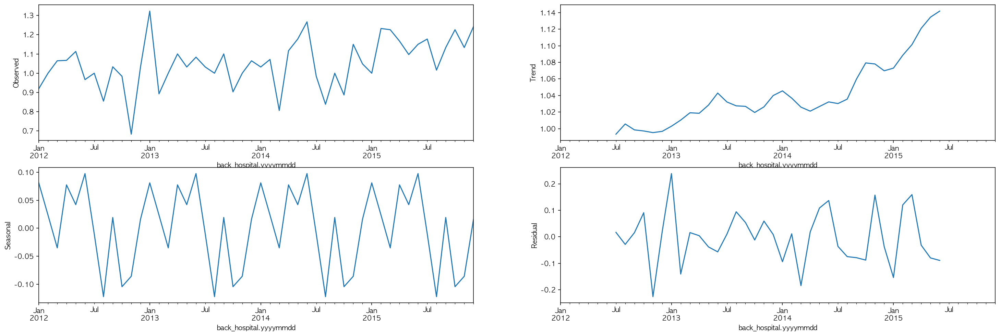

In [ ]:
seasonal_강원 = seasonal_decompose(강원['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_강원)

In [ ]:
강원_corr = pd.DataFrame()

for col in 강원.columns[1:32]:
        강원_corr.loc[col, 'corr'] = stats.pearsonr(강원['back_hospital.frequency'], 강원[col])[0]
        강원_corr.loc[col, 'p_value'] = stats.pearsonr(강원['back_hospital.frequency'], 강원[col])[1]

강원_corr[강원_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
minPsHrmt,0.326253,0.023631


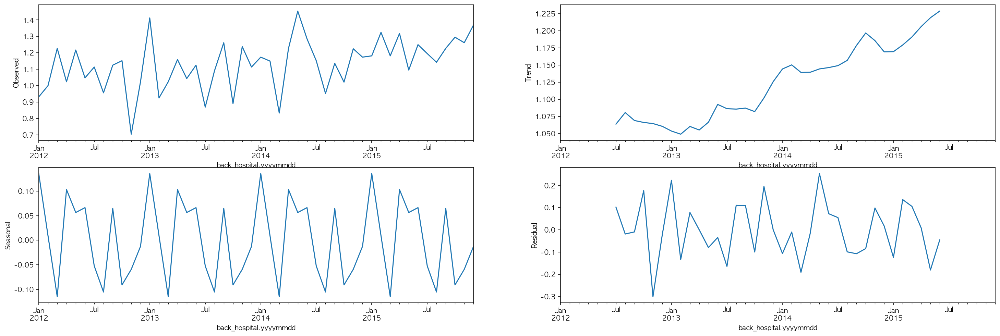

In [ ]:
seasonal_강원_평일 = seasonal_decompose(강원_평일['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_강원_평일)

In [ ]:
강원_주말_corr = pd.DataFrame()

for col in 강원_주말.columns[1:32]:
        강원_주말_corr.loc[col, 'corr'] = stats.pearsonr(강원_주말['back_hospital.frequency'], 강원_주말[col])[0]
        강원_주말_corr.loc[col, 'p_value'] = stats.pearsonr(강원_주말['back_hospital.frequency'], 강원_주말[col])[1]

강원_주말_corr[강원_주말_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.0,0.0


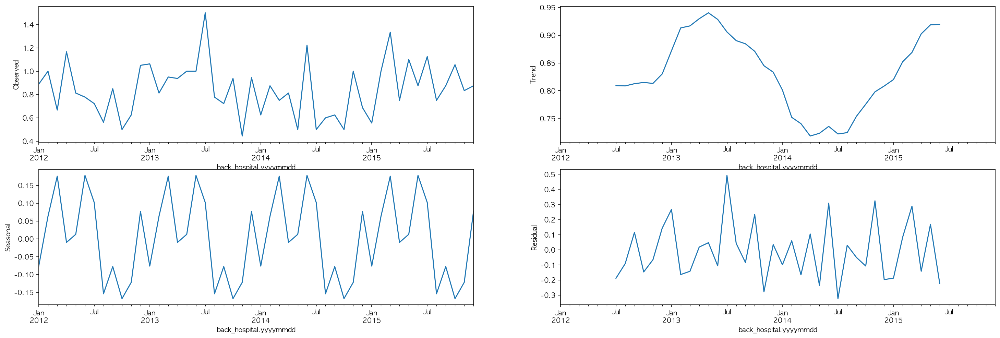

In [ ]:
seasonal_강원_주말 = seasonal_decompose(강원_주말['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_강원_주말)

In [ ]:
강원_주말_corr = pd.DataFrame()

for col in 강원_주말.columns[1:32]:
        강원_주말_corr.loc[col, 'corr'] = stats.pearsonr(강원_주말['back_hospital.frequency'], 강원_주말[col])[0]
        강원_주말_corr.loc[col, 'p_value'] = stats.pearsonr(강원_주말['back_hospital.frequency'], 강원_주말[col])[1]

강원_주말_corr[강원_주말_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.0,0.0


### 지역 분석 '경기'

In [ ]:
경기 = df_aos[df_aos['back_hospital.area'] == '경기']
경기_평일 = 경기[경기['week'] == '평일']
경기_주말 = 경기[경기['week'] == '주말']

경기 = 경기.resample('M').mean()
경기_주말 = 경기_주말.resample('M').mean()
경기_평일 = 경기_평일.resample('M').mean()

경기.describe()

,back_hospital.sex,back_hospital.frequency,avgTa,minTa,minTaHrmt,maxTa,maxTaHrmt,maxInsWs,maxInsWsWd,maxInsWsHrmt,...,avgPa,maxPs,maxPsHrmt,minPs,minPsHrmt,avgPs,ssDur,sumSsHr,avgTs,minTg
count,48.0,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,...,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,1.5,4.542250,11.896655,6.759418,878.815241,17.945296,1396.446670,7.099051,223.221131,1381.207086,...,1009.103756,1018.985923,1168.316257,1013.677022,1275.526046,1016.293052,12.194025,6.442606,13.931216,4.874383
std,0.0,0.301291,10.453140,10.783510,134.483441,10.441810,50.276748,0.956097,24.409088,92.359310,...,6.650626,7.302456,105.748421,6.696943,106.703947,6.972542,1.780575,1.294865,11.205960,11.296915
min,1.5,3.850000,-5.154839,-9.981935,572.633333,-0.105806,1250.486667,5.356000,167.548387,1130.361290,...,998.428387,1007.245161,958.346667,1003.395484,1054.006452,1005.177419,9.627742,3.038710,-2.997419,-12.760000
25%,1.5,4.366667,3.644429,-2.092581,778.720000,9.185607,1371.332742,6.243656,205.433333,1319.893548,...,1002.350000,1011.717581,1092.836398,1006.851290,1204.145161,1009.257097,10.649202,5.772167,4.122393,-4.979194
50%,1.5,4.532527,13.288785,7.296011,905.116129,20.539441,1403.854839,6.951409,223.104301,1372.806667,...,1010.212516,1020.209387,1150.157097,1014.281204,1283.003226,1017.491161,12.200667,6.365952,15.346763,4.733634
75%,1.5,4.749583,20.996000,16.324833,964.275000,27.522500,1429.428387,7.769000,241.532258,1455.262581,...,1014.750248,1025.106924,1240.638710,1019.494752,1352.884761,1022.327753,13.748065,7.234839,24.206833,14.803833
max,1.5,5.083333,26.677419,22.841935,1118.833333,31.742581,1471.373333,9.553333,258.967742,1532.326667,...,1018.783226,1029.160645,1398.490323,1023.945161,1497.293333,1026.527097,14.719333,9.494839,29.260667,22.255484


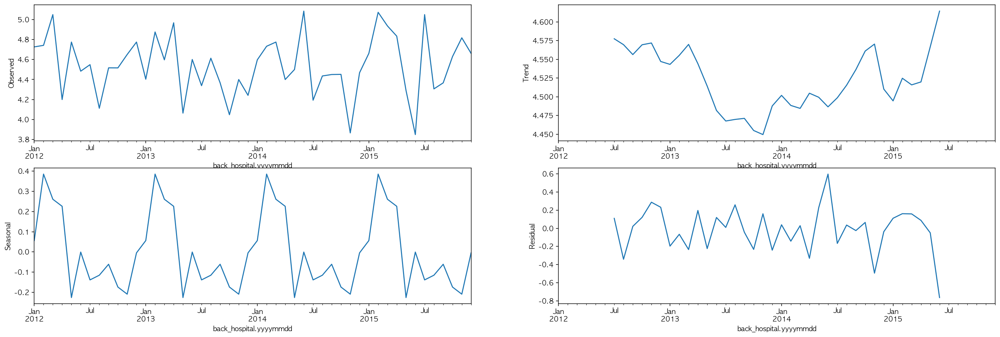

In [ ]:
seasonal_경기 = seasonal_decompose(경기['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_경기)

In [ ]:
경기_corr = pd.DataFrame()

for col in 경기.columns[1:32]:
        경기_corr.loc[col, 'corr'] = stats.pearsonr(경기['back_hospital.frequency'], 경기[col])[0]
        경기_corr.loc[col, 'p_value'] = stats.pearsonr(경기['back_hospital.frequency'], 경기[col])[1]
        
경기_corr[경기_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
maxWd,0.339215,0.018344
avgTd,-0.323693,0.024813
maxTa,-0.315409,0.028985
avgTs,-0.312430,0.030621
avgTa,-0.306398,0.034169
minTg,-0.299012,0.038970
minTa,-0.298379,0.039406
avgRhm,-0.295134,0.041704
avgPv,-0.286882,0.048046


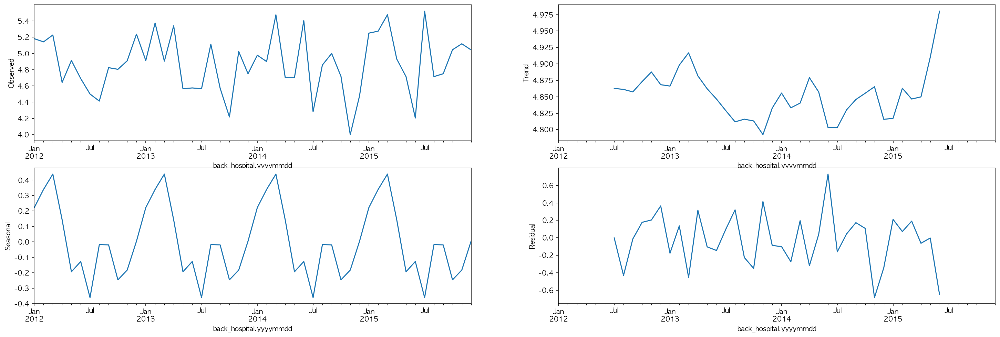

In [ ]:
seasonal_경기_평일 = seasonal_decompose(경기_평일['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_경기_평일)

In [ ]:
경기_평일_corr = pd.DataFrame()

for col in 경기_평일.columns[1:32]:
        경기_평일_corr.loc[col, 'corr'] = stats.pearsonr(경기_평일['back_hospital.frequency'], 경기_평일[col])[0]
        경기_평일_corr.loc[col, 'p_value'] = stats.pearsonr(경기_평일['back_hospital.frequency'], 경기_평일[col])[1]
        
경기_평일_corr[경기_평일_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
avgTd,-0.387967,0.006436
maxTa,-0.386338,0.006683
avgTs,-0.381787,0.007414
avgTa,-0.378935,0.007907
minTa,-0.372896,0.009046
minTg,-0.369049,0.009844
maxWd,0.348308,0.015264
avgPv,-0.343204,0.016933
maxInsWsWd,0.324174,0.024588


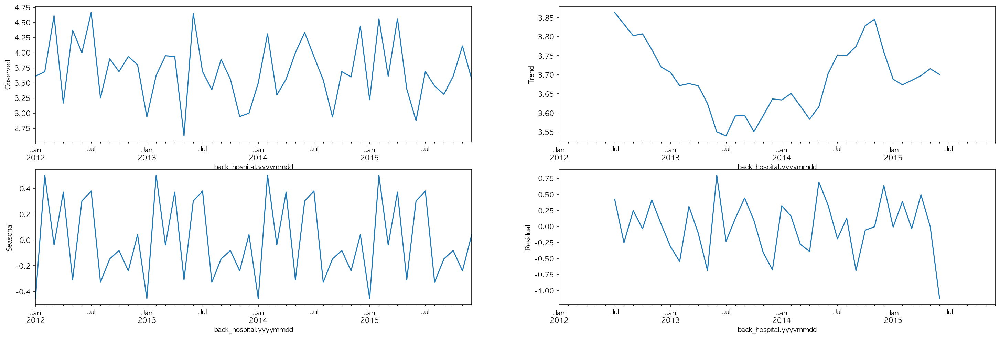

In [ ]:
seasonal_경기_주말 = seasonal_decompose(경기_주말['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_경기_주말)

In [ ]:
경기_주말_corr = pd.DataFrame()

for col in 경기_주말.columns[1:32]:
        경기_주말_corr.loc[col, 'corr'] = stats.pearsonr(경기_주말['back_hospital.frequency'], 경기_주말[col])[0]
        경기_주말_corr.loc[col, 'p_value'] = stats.pearsonr(경기_주말['back_hospital.frequency'], 경기_주말[col])[1]
        
경기_주말_corr[경기_주말_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
avgWs,0.323896,0.024717
hr24SumRws,0.323889,0.024721


### 지역 분석 '경남'

In [ ]:
경남 = df_aos[df_aos['back_hospital.area'] == '경남']
경남_주말 = 경남[경남['week'] == '주말']
경남_평일 = 경남[경남['week'] == '평일']

경남 = 경남.resample('M').mean()
경남_주말 = 경남_주말.resample('M').mean()
경남_평일 = 경남_평일.resample('M').mean()
경남.describe()

,back_hospital.sex,back_hospital.frequency,avgTa,minTa,minTaHrmt,maxTa,maxTaHrmt,maxInsWs,maxInsWsWd,maxInsWsHrmt,...,avgPa,maxPs,maxPsHrmt,minPs,minPsHrmt,avgPs,ssDur,sumSsHr,avgTs,minTg
count,48.0,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,...,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,1.5,2.046239,13.775005,8.999982,883.218617,19.444591,1376.263494,7.516587,203.258677,1338.247220,...,1008.515612,1018.803604,1200.580043,1013.391479,1264.454651,1016.051943,12.186162,6.238193,15.849246,6.462823
std,0.0,0.191505,8.780813,9.267318,118.457186,8.581134,39.341062,0.948880,29.187334,65.258481,...,5.933792,6.607148,100.958716,5.855802,89.973695,6.225201,1.633989,1.225389,10.235403,10.243705
min,1.5,1.645161,-0.164977,-5.095161,618.011905,5.361982,1248.509524,5.786190,150.595238,1186.845622,...,999.398333,1008.375000,1022.317972,1004.491014,1058.483871,1006.502074,9.834332,3.234101,-0.407143,-8.208065
25%,1.5,1.908842,6.691302,1.336175,798.144144,11.871717,1355.213134,6.809101,181.728495,1291.649194,...,1002.480876,1012.284101,1114.538078,1007.242281,1192.062385,1009.757834,10.768299,5.489142,6.839107,-2.292857
50%,1.5,2.033065,14.326813,8.626820,895.879762,21.227281,1381.561060,7.507028,198.674731,1332.469048,...,1009.249105,1020.239301,1179.404608,1013.602619,1275.237980,1016.871459,12.193963,6.180987,16.824078,6.009105
75%,1.5,2.178898,21.348155,17.210357,947.603387,26.700060,1403.071190,8.174892,225.251152,1390.123329,...,1013.582141,1024.449047,1268.964286,1018.647231,1331.037788,1021.496507,13.613652,6.880495,25.470504,15.567143
max,1.5,2.516129,27.548697,23.574424,1117.573733,33.098298,1447.010204,9.884286,265.691244,1456.330734,...,1017.114977,1027.897235,1382.366359,1022.408295,1417.596774,1025.113594,14.502381,9.200691,32.466005,22.841865


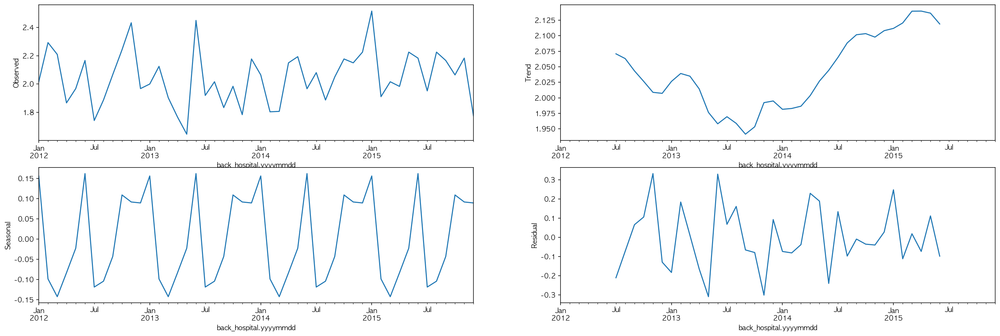

In [ ]:
seasonal_경남 = seasonal_decompose(경남['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_경남)

In [ ]:
경남_corr = pd.DataFrame()

for col in 경남.columns[1:32]:
        경남_corr.loc[col, 'corr'] = stats.pearsonr(경남['back_hospital.frequency'], 경남[col])[0]
        경남_corr.loc[col, 'p_value'] = stats.pearsonr(경남['back_hospital.frequency'], 경남[col])[1]

경남_corr[경남_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.0,0.0


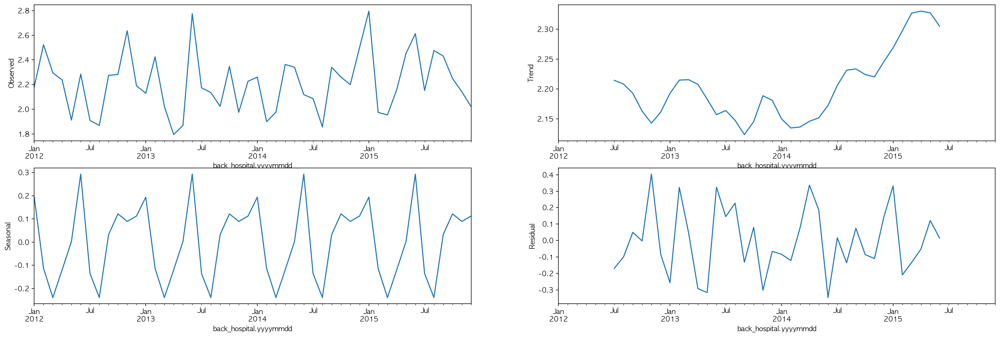

In [ ]:
seasonal_경남_평일 = seasonal_decompose(경남_평일['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_경남_평일)

In [ ]:
경남_경남_평일_corr = pd.DataFrame()

for col in 경남_평일.columns[1:32]:
        경남_경남_평일_corr.loc[col, 'corr'] = stats.pearsonr(경남_평일['back_hospital.frequency'], 경남_평일[col])[0]
        경남_경남_평일_corr.loc[col, 'p_value'] = stats.pearsonr(경남_평일['back_hospital.frequency'], 경남_평일[col])[1]

경남_경남_평일_corr[경남_경남_평일_corr['p_value'] < 0.5].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
maxInsWs,-0.207500,0.157021
maxWs,-0.206520,0.159033
hr24SumRws,-0.188849,0.198617
avgWs,-0.188769,0.198811
maxWsHrmt,-0.123939,0.401309
maxPsHrmt,-0.116234,0.431437
maxWd,0.111313,0.451322
maxWsWd,0.105762,0.474339
maxInsWsHrmt,-0.104972,0.477665


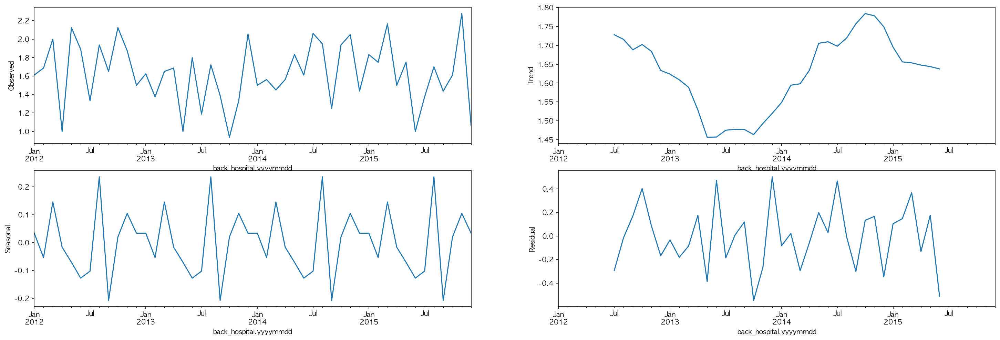

In [ ]:
seasonal_경남_주말 = seasonal_decompose(경남_주말['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_경남_주말)

In [ ]:
경남_주말_corr = pd.DataFrame()

for col in 경남.columns[1:32]:
        경남_주말_corr.loc[col, 'corr'] = stats.pearsonr(경남_주말['back_hospital.frequency'], 경남_주말[col])[0]
        경남_주말_corr.loc[col, 'p_value'] = stats.pearsonr(경남_주말['back_hospital.frequency'], 경남_주말[col])[1]

경남_주말_corr[경남_주말_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
minPsHrmt,0.312934,0.030339
maxPsHrmt,-0.310820,0.031537


### 지역 분석'경북'

In [ ]:
경북 = df_aos[df_aos['back_hospital.area'] == '경북']
경북_주말 = 경북[경북['week'] == '주말']
경북_평일 = 경북[경북['week'] == '평일']

경북 = 경북.resample('M').mean()
경북_주말 = 경북_주말.resample('M').mean()
경북_평일 = 경북_평일.resample('M').mean()
경북.describe()

,back_hospital.sex,back_hospital.frequency,avgTa,minTa,minTaHrmt,maxTa,maxTaHrmt,maxInsWs,maxInsWsWd,maxInsWsHrmt,...,avgPa,maxPs,maxPsHrmt,minPs,minPsHrmt,avgPs,ssDur,sumSsHr,avgTs,minTg
count,48.0,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,...,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,1.5,1.922118,12.398638,7.186017,921.251366,18.351501,1366.542257,8.064847,220.393166,1319.533291,...,1002.187542,1018.915052,1186.435929,1013.150023,1276.904746,1016.005528,12.197398,6.123922,14.873909,4.957204
std,0.0,0.164849,9.350784,9.694948,111.604766,9.326462,44.903334,1.201617,34.929072,62.644541,...,5.788592,6.707655,104.782175,6.016870,102.015153,6.351129,1.718933,1.302457,10.901991,10.265724
min,1.5,1.629032,-2.611911,-7.869975,677.887179,2.700248,1195.451282,5.990000,160.923077,1161.312655,...,992.802978,1007.753846,967.136476,1003.903226,988.558313,1005.765012,9.731266,2.639487,-1.753598,-9.649628
25%,1.5,1.783333,4.952631,-0.636849,842.270533,10.214811,1346.720533,7.050947,192.080025,1275.212159,...,996.264614,1012.079094,1107.552109,1006.958623,1206.003122,1009.405888,10.709712,5.567909,5.234293,-3.975124
50%,1.5,1.932184,13.071667,6.733553,918.765509,20.202308,1369.548056,7.877543,223.697270,1323.775641,...,1002.799231,1020.560699,1191.803391,1013.583718,1271.205955,1016.748400,12.198420,6.015261,15.921836,4.136530
75%,1.5,2.024597,20.415604,15.700315,1010.116005,26.205924,1397.116005,9.172423,248.772499,1371.970585,...,1006.985563,1024.330673,1259.874069,1018.375536,1351.230632,1021.258324,13.679342,6.592257,24.567432,14.135000
max,1.5,2.306452,26.752047,22.447891,1131.662531,32.565757,1449.622829,10.364103,276.923077,1458.361538,...,1010.470968,1028.165509,1390.116625,1022.322829,1468.942928,1025.269479,14.952051,9.401075,31.141253,21.577419


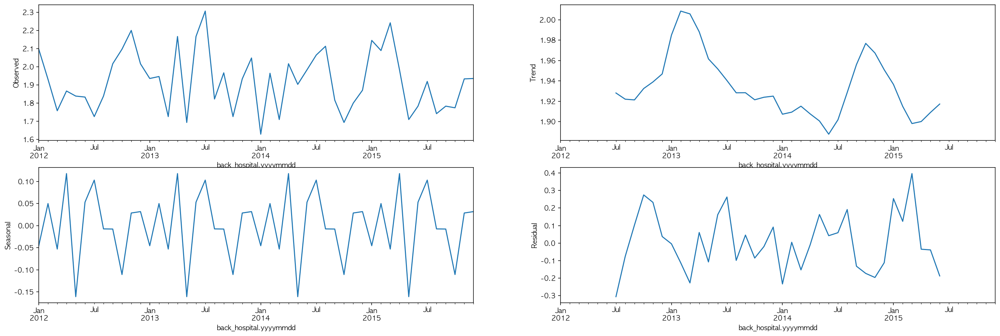

In [ ]:
seasonal_경북 = seasonal_decompose(경북['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_경북)

In [ ]:
경북_corr = pd.DataFrame()

for col in 경북.columns[1:32]:
        경북_corr.loc[col, 'corr'] = stats.pearsonr(경북['back_hospital.frequency'], 경북[col])[0]
        경북_corr.loc[col, 'p_value'] = stats.pearsonr(경북['back_hospital.frequency'], 경북[col])[1]

경북_corr[경북_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.0,0.0


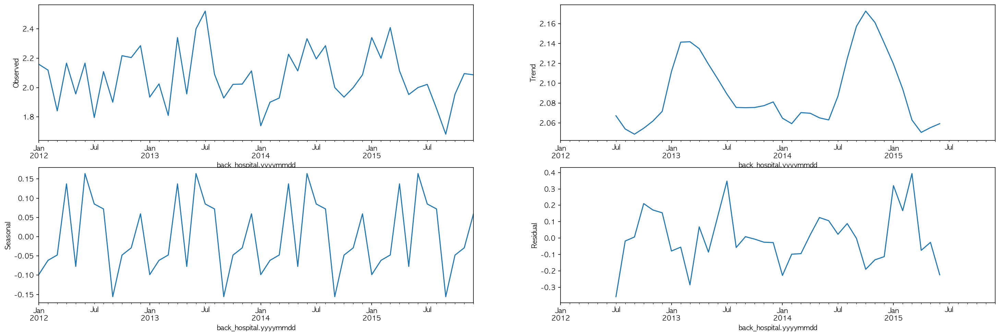

In [ ]:
seasonal_경북_평일 = seasonal_decompose(경북_평일['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_경북_평일)

In [ ]:
경북_평일_corr = pd.DataFrame()

for col in 경북_평일.columns[1:32]:
        경북_평일_corr.loc[col, 'corr'] = stats.pearsonr(경북_평일['back_hospital.frequency'], 경북_평일[col])[0]
        경북_평일_corr.loc[col, 'p_value'] = stats.pearsonr(경북_평일['back_hospital.frequency'], 경북_평일[col])[1]

경북_평일_corr[경북_평일_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.0,0.0


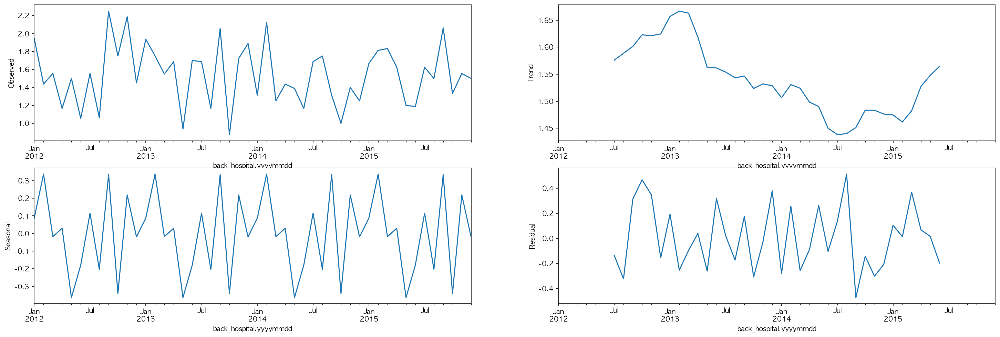

In [ ]:
seasonal_경북_주말 = seasonal_decompose(경북_주말['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_경북_주말)

In [ ]:
경북_주말_corr = pd.DataFrame()

for col in 경북_주말.columns[1:32]:
        경북_주말_corr.loc[col, 'corr'] = stats.pearsonr(경북_주말['back_hospital.frequency'], 경북_주말[col])[0]
        경북_주말_corr.loc[col, 'p_value'] = stats.pearsonr(경북_주말['back_hospital.frequency'], 경북_주말[col])[1]

경북_주말_corr[경북_주말_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
sumSsHr,-0.331769,0.021243


### 지역 분석 '광주'

In [ ]:
광주 = df_aos[df_aos['back_hospital.area'] == '광주']
광주_주말 = 광주[광주['week'] == '주말']
광주_평일 = 광주[광주['week'] == '평일']

광주 = 광주.resample('M').mean()
광주_주말 = 광주_주말.resample('M').mean()
광주_평일 = 광주_평일.resample('M').mean()
광주.describe()

,back_hospital.sex,back_hospital.frequency,avgTa,minTa,minTaHrmt,maxTa,maxTaHrmt,maxInsWs,maxInsWsWd,maxInsWsHrmt,...,avgPa,maxPs,maxPsHrmt,minPs,minPsHrmt,avgPs,ssDur,sumSsHr,avgTs,minTg
count,48.0,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,...,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,1.5,0.726633,14.195303,9.934543,895.448783,19.499455,1352.504003,8.026153,175.865264,1371.447789,...,1007.906796,1019.128310,1197.601162,1014.037576,1280.670981,1016.545362,12.184342,6.446383,16.286504,7.453028
std,0.0,0.100662,9.213442,9.390873,132.722345,9.267389,59.947123,0.931196,32.558351,119.343680,...,6.443056,7.070039,101.721656,6.539067,113.395668,6.789617,1.626542,1.329894,10.070606,10.011610
min,1.5,0.548387,-0.025806,-3.867742,643.400000,4.651613,1225.200000,5.776667,117.333333,1071.000000,...,998.245161,1008.363333,953.903226,1004.009677,1033.129032,1006.396774,9.838710,3.090000,1.258065,-7.783871
25%,1.5,0.650000,6.195161,1.747581,800.408065,11.221371,1310.070699,7.508266,151.774194,1305.741935,...,1001.650806,1012.369355,1113.927957,1007.626613,1197.549731,1009.997581,10.774881,5.630645,7.184044,-2.040323
50%,1.5,0.703053,15.184785,10.116183,888.153763,21.641344,1367.810753,7.996774,179.693548,1388.277419,...,1009.057688,1020.353387,1201.755914,1014.516022,1289.094086,1017.799839,12.195108,6.135000,17.958978,6.640000
75%,1.5,0.794828,22.527500,18.441667,981.758065,27.701667,1400.637097,8.477419,202.096774,1451.622581,...,1013.919384,1025.366613,1249.596774,1020.394758,1374.393452,1022.901048,13.604839,7.541855,25.599194,16.408333
max,1.5,1.000000,28.406452,24.661290,1212.419355,33.377419,1444.966667,10.306667,234.000000,1595.900000,...,1017.241935,1028.958065,1467.774194,1024.058065,1479.354839,1026.451613,14.480000,9.825806,31.948387,23.309677


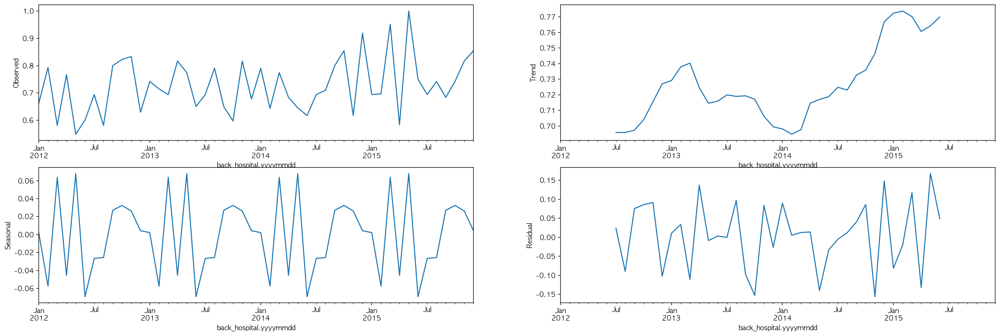

In [ ]:
seasonal_광주 = seasonal_decompose(광주['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_광주)

In [ ]:
광주_corr = pd.DataFrame()

for col in 광주.columns[1:32]:
        광주_corr.loc[col, 'corr'] = stats.pearsonr(광주['back_hospital.frequency'], 광주[col])[0]
        광주_corr.loc[col, 'p_value'] = stats.pearsonr(광주['back_hospital.frequency'], 광주[col])[1]

광주_corr[광주_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.0,0.0


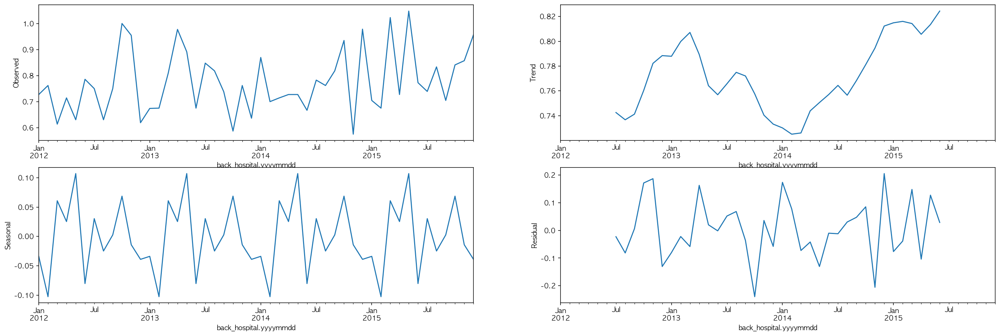

In [ ]:
seasonal_광주_평일 = seasonal_decompose(광주_평일['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_광주_평일)

In [ ]:
광주_평일_corr = pd.DataFrame()

for col in 광주_평일.columns[1:32]:
        광주_평일_corr.loc[col, 'corr'] = stats.pearsonr(광주_평일['back_hospital.frequency'], 광주_평일[col])[0]
        광주_평일_corr.loc[col, 'p_value'] = stats.pearsonr(광주_평일['back_hospital.frequency'], 광주_평일[col])[1]

광주_평일_corr[광주_평일_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.00000,0.000000
maxWsHrmt,0.38343,0.007142


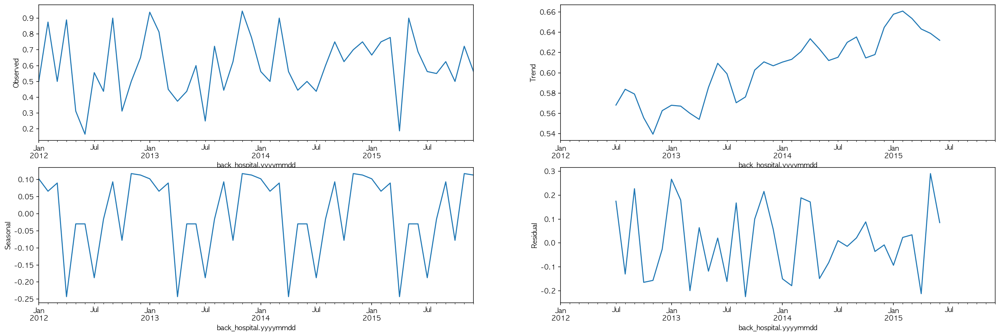

In [ ]:
seasonal_광주_주말 = seasonal_decompose(광주_주말['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_광주_주말)

In [ ]:
광주_주말_corr = pd.DataFrame()

for col in 광주_주말.columns[1:32]:
        광주_주말_corr.loc[col, 'corr'] = stats.pearsonr(광주_주말['back_hospital.frequency'], 광주_주말[col])[0]
        광주_주말_corr.loc[col, 'p_value'] = stats.pearsonr(광주_주말['back_hospital.frequency'], 광주_주말[col])[1]

광주_주말_corr[광주_주말_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
ssDur,-0.389130,0.006265
maxWsWd,-0.383773,0.007087
maxTa,-0.380328,0.007663
avgTs,-0.363551,0.011087
avgTa,-0.362903,0.011243
maxPs,0.356923,0.012764
avgPs,0.356434,0.012896
avgPa,0.354704,0.013372
minTa,-0.352883,0.013889


### 지역 분석 '대구'

In [ ]:
대구 = df_aos[df_aos['back_hospital.area'] == '대구']
대구_주말 = 대구[대구['week'] == '주말']
대구_평일 = 대구[대구['week'] == '평일']

대구 = 대구.resample('M').mean()
대구_주말 = 대구_주말.resample('M').mean()
대구_평일 = 대구_평일.resample('M').mean()
대구.describe()

,back_hospital.sex,back_hospital.frequency,avgTa,minTa,minTaHrmt,maxTa,maxTaHrmt,maxInsWs,maxInsWsWd,maxInsWsHrmt,...,avgPa,maxPs,maxPsHrmt,minPs,minPsHrmt,avgPs,ssDur,sumSsHr,avgTs,minTg
count,48.0,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,...,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,1.5,1.150451,14.676766,10.193313,880.073537,19.956890,1407.556054,7.822964,222.012545,1393.854047,...,1009.176883,1019.397042,1186.913129,1013.813873,1303.046384,1016.570898,12.187440,6.854579,16.848515,5.902666
std,0.0,0.161235,9.286762,9.361149,126.304831,9.428521,57.102108,0.779211,38.417475,106.742924,...,6.132124,6.817610,107.371935,6.166047,124.509801,6.470249,1.675142,1.314369,10.769027,10.622450
min,1.5,0.783333,-0.290323,-4.477419,623.612903,3.919355,1250.266667,6.503226,150.666667,1103.774194,...,999.664516,1008.761290,983.100000,1004.620000,1072.806452,1006.816129,9.770968,3.100000,-0.461290,-10.438710
25%,1.5,1.072581,6.876613,2.612903,794.229839,11.871285,1372.479032,7.275565,195.548387,1326.182028,...,1002.714516,1012.716935,1106.484677,1007.503226,1202.814516,1010.054839,10.731250,6.321452,7.664107,-2.670161
50%,1.5,1.129032,15.658065,10.239677,892.969540,21.781237,1416.758065,7.861290,222.731183,1408.512366,...,1009.790000,1020.726237,1197.487634,1014.140000,1311.419355,1017.486935,12.196828,6.838485,18.263925,5.086667
75%,1.5,1.252016,22.890833,18.481667,971.911290,28.065484,1447.040323,8.172634,253.043011,1474.308333,...,1014.236964,1025.161290,1257.433333,1019.402143,1394.991129,1022.231164,13.648387,7.445968,25.728306,15.463333
max,1.5,1.532258,29.019355,25.067742,1113.032258,34.435484,1514.741935,10.023333,288.064516,1600.774194,...,1018.064516,1029.006452,1443.967742,1023.467742,1519.419355,1026.225806,14.566667,9.987097,32.109677,22.964516


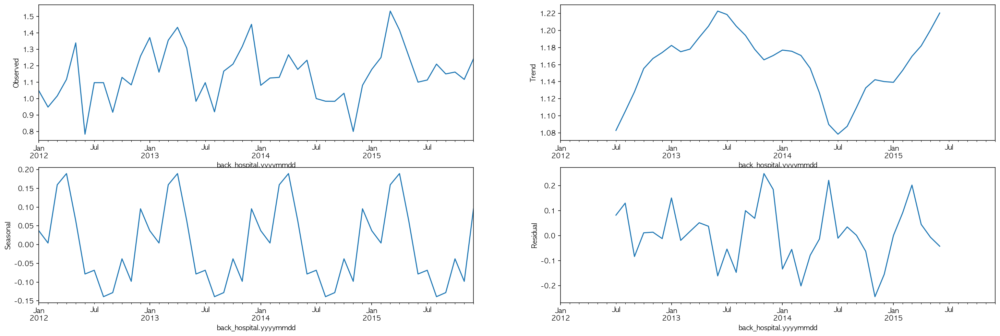

In [ ]:
seasonal_대구 = seasonal_decompose(대구['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_대구)

In [ ]:
대구_corr = pd.DataFrame()

for col in 대구.columns[1:32]:
        대구_corr.loc[col, 'corr'] = stats.pearsonr(대구['back_hospital.frequency'], 대구[col])[0]
        대구_corr.loc[col, 'p_value'] = stats.pearsonr(대구['back_hospital.frequency'], 대구[col])[1]

대구_corr[대구_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
avgPv,-0.369380,0.009773
avgRhm,-0.342914,0.017033
maxWs,0.334221,0.020248
minRhm,-0.330200,0.021900
avgTd,-0.325589,0.023933
maxInsWs,0.318421,0.027405
minTg,-0.316473,0.028419
minTa,-0.310510,0.031716


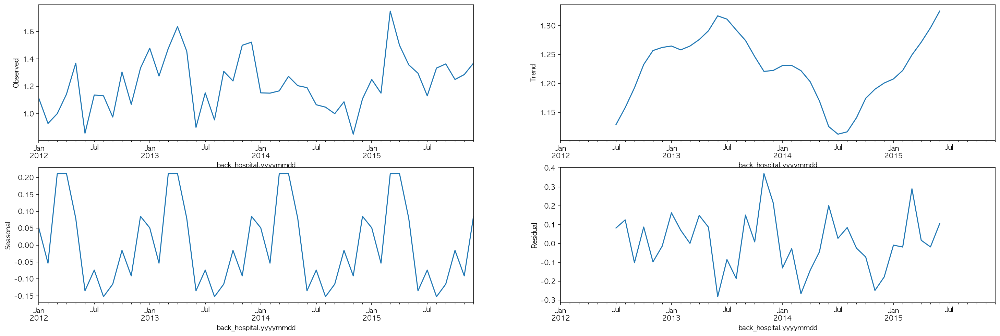

In [ ]:
seasonal_대구_평일 = seasonal_decompose(대구_평일['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_대구_평일)

In [ ]:
대구_평일_corr = pd.DataFrame()

for col in 대구_평일.columns[1:32]:
        대구_평일_corr.loc[col, 'corr'] = stats.pearsonr(대구_평일['back_hospital.frequency'], 대구_평일[col])[0]
        대구_평일_corr.loc[col, 'p_value'] = stats.pearsonr(대구_평일['back_hospital.frequency'], 대구_평일[col])[1]

대구_평일_corr[대구_평일_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
maxWs,0.316530,0.028389
avgPv,-0.312394,0.030641
maxInsWs,0.295954,0.041113


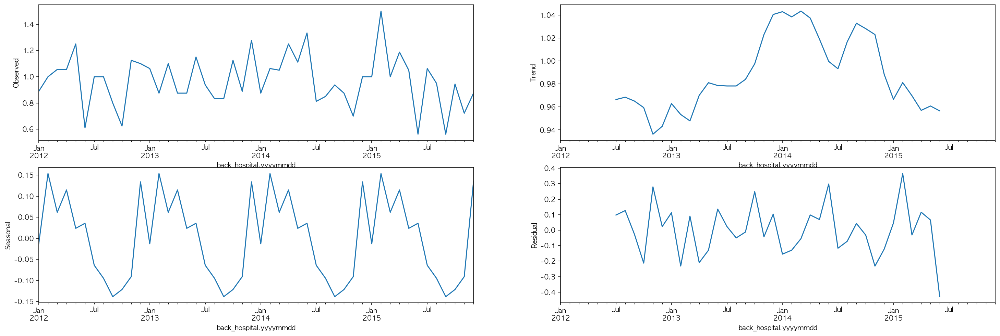

In [ ]:
seasonal_대구_주말 = seasonal_decompose(대구_주말['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_대구_주말)

In [ ]:
대구_주말_corr = pd.DataFrame()

for col in 대구.columns[1:32]:
        대구_주말_corr.loc[col, 'corr'] = stats.pearsonr(대구_주말['back_hospital.frequency'], 대구_주말[col])[0]
        대구_주말_corr.loc[col, 'p_value'] = stats.pearsonr(대구_주말['back_hospital.frequency'], 대구_주말[col])[1]

대구_corr[대구_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
avgPv,-0.369380,0.009773
avgRhm,-0.342914,0.017033
maxWs,0.334221,0.020248
minRhm,-0.330200,0.021900
avgTd,-0.325589,0.023933
maxInsWs,0.318421,0.027405
minTg,-0.316473,0.028419
minTa,-0.310510,0.031716


### 지역 분석 '대전'

In [ ]:
대전 = df_aos[df_aos['back_hospital.area'] == '대전']
대전_주말 = 대전[대전['week'] == '주말']
대전_평일 = 대전[대전['week'] == '평일']

대전 = 대전.resample('M').mean()
대전_주말 = 대전_주말.resample('M').mean()
대전_평일 = 대전_평일.resample('M').mean()
대구.describe()

,back_hospital.sex,back_hospital.frequency,avgTa,minTa,minTaHrmt,maxTa,maxTaHrmt,maxInsWs,maxInsWsWd,maxInsWsHrmt,...,avgPa,maxPs,maxPsHrmt,minPs,minPsHrmt,avgPs,ssDur,sumSsHr,avgTs,minTg
count,48.0,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,...,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,1.5,1.150451,14.676766,10.193313,880.073537,19.956890,1407.556054,7.822964,222.012545,1393.854047,...,1009.176883,1019.397042,1186.913129,1013.813873,1303.046384,1016.570898,12.187440,6.854579,16.848515,5.902666
std,0.0,0.161235,9.286762,9.361149,126.304831,9.428521,57.102108,0.779211,38.417475,106.742924,...,6.132124,6.817610,107.371935,6.166047,124.509801,6.470249,1.675142,1.314369,10.769027,10.622450
min,1.5,0.783333,-0.290323,-4.477419,623.612903,3.919355,1250.266667,6.503226,150.666667,1103.774194,...,999.664516,1008.761290,983.100000,1004.620000,1072.806452,1006.816129,9.770968,3.100000,-0.461290,-10.438710
25%,1.5,1.072581,6.876613,2.612903,794.229839,11.871285,1372.479032,7.275565,195.548387,1326.182028,...,1002.714516,1012.716935,1106.484677,1007.503226,1202.814516,1010.054839,10.731250,6.321452,7.664107,-2.670161
50%,1.5,1.129032,15.658065,10.239677,892.969540,21.781237,1416.758065,7.861290,222.731183,1408.512366,...,1009.790000,1020.726237,1197.487634,1014.140000,1311.419355,1017.486935,12.196828,6.838485,18.263925,5.086667
75%,1.5,1.252016,22.890833,18.481667,971.911290,28.065484,1447.040323,8.172634,253.043011,1474.308333,...,1014.236964,1025.161290,1257.433333,1019.402143,1394.991129,1022.231164,13.648387,7.445968,25.728306,15.463333
max,1.5,1.532258,29.019355,25.067742,1113.032258,34.435484,1514.741935,10.023333,288.064516,1600.774194,...,1018.064516,1029.006452,1443.967742,1023.467742,1519.419355,1026.225806,14.566667,9.987097,32.109677,22.964516


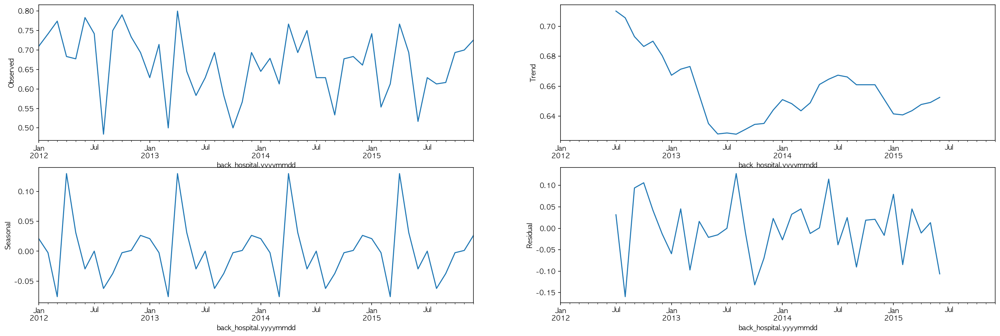

In [ ]:
seasonal_대전 = seasonal_decompose(대전['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_대전)

In [ ]:
대전_corr = pd.DataFrame()

for col in 대구.columns[1:32]:
        대전_corr.loc[col, 'corr'] = stats.pearsonr(대구['back_hospital.frequency'], 대구[col])[0]
        대전_corr.loc[col, 'p_value'] = stats.pearsonr(대구['back_hospital.frequency'], 대구[col])[1]

대전_corr[대전_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
avgPv,-0.369380,0.009773
avgRhm,-0.342914,0.017033
maxWs,0.334221,0.020248
minRhm,-0.330200,0.021900
avgTd,-0.325589,0.023933
maxInsWs,0.318421,0.027405
minTg,-0.316473,0.028419
minTa,-0.310510,0.031716


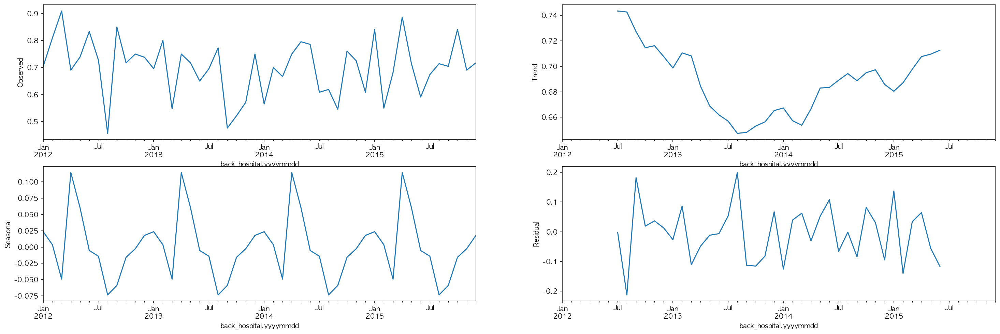

In [ ]:
seasonal_대전_평일 = seasonal_decompose(대전_평일['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_대전_평일)

In [ ]:
대전_평일_corr = pd.DataFrame()

for col in 대구_평일.columns[1:32]:
        대전_평일_corr.loc[col, 'corr'] = stats.pearsonr(대전_평일['back_hospital.frequency'], 대전_평일[col])[0]
        대전_평일_corr.loc[col, 'p_value'] = stats.pearsonr(대전_평일['back_hospital.frequency'], 대전_평일[col])[1]

대전_평일_corr[대전_평일_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.0,0.0


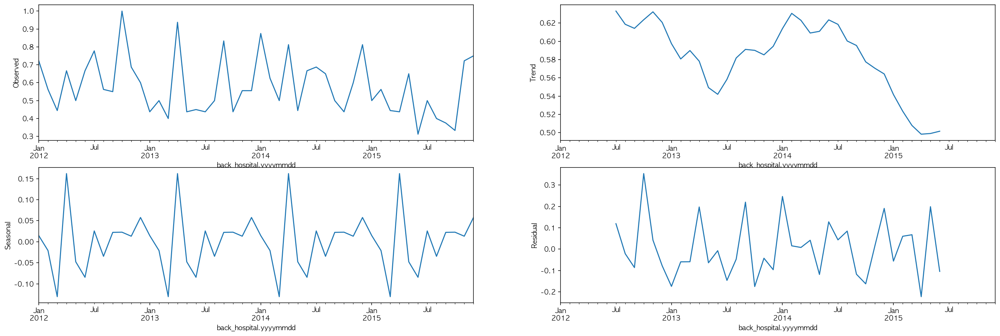

In [ ]:
seasonal_대전_주말 = seasonal_decompose(대전_주말['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_대전_주말)

In [ ]:
대전_주말_corr = pd.DataFrame()

for col in 대구_주말.columns[1:32]:
        대전_주말_corr.loc[col, 'corr'] = stats.pearsonr(대전_주말['back_hospital.frequency'], 대전_주말[col])[0]
        대전_주말_corr.loc[col, 'p_value'] = stats.pearsonr(대전_주말['back_hospital.frequency'], 대전_주말[col])[1]

대전_주말_corr[대전_주말_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
minTaHrmt,0.348847,0.015096
sumSsHr,-0.347418,0.015545
minRhmHrmt,-0.343242,0.016921


### 지역 분석 '부산'

In [ ]:
부산 = df_aos[df_aos['back_hospital.area'] == '부산']
부산_주말 = 부산[부산['week'] == '주말']
부산_평일 = 부산[부산['week'] == '평일']

부산 = 부산.resample('M').mean()
부산_주말 = 부산_주말.resample('M').mean()
부산_평일 = 부산_평일.resample('M').mean()
부산.describe()

,back_hospital.sex,back_hospital.frequency,avgTa,minTa,minTaHrmt,maxTa,maxTaHrmt,maxInsWs,maxInsWsWd,maxInsWsHrmt,...,avgPa,maxPs,maxPsHrmt,minPs,minPsHrmt,avgPs,ssDur,sumSsHr,avgTs,minTg
count,48.0,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,...,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,1.5,1.761290,15.073562,11.813350,889.353271,19.207711,1282.950495,10.796221,195.682723,1177.095119,...,1007.436399,1018.273900,1199.335843,1013.216727,1154.728516,1015.698530,12.184272,7.074287,16.791745,8.723836
std,0.0,0.200794,7.963504,8.476085,112.445647,7.548880,63.405087,1.268018,46.657145,151.803748,...,5.559502,6.229297,107.472779,5.435529,91.967752,5.835376,1.624176,1.192408,9.747544,9.404769
min,1.5,1.354839,2.538710,-1.400000,566.600000,7.129032,1142.193548,8.446667,111.000000,913.387097,...,998.730000,1008.363333,1022.166667,1005.019355,911.677419,1006.696667,9.841935,3.900000,1.280645,-5.748387
25%,1.5,1.620833,8.187097,4.808871,804.604839,12.379839,1250.564286,9.860000,160.059140,1053.350000,...,1001.790323,1012.060484,1114.546237,1007.718548,1104.227419,1009.807258,10.778393,6.212930,8.904194,1.010484
50%,1.5,1.774194,16.188710,12.568656,902.550000,20.695968,1277.403226,10.797293,188.548387,1188.963441,...,1008.294516,1019.657419,1207.580645,1013.948333,1150.758065,1016.652366,12.188602,7.072473,17.854677,9.076237
75%,1.5,1.850000,21.972500,19.149167,968.704116,25.431667,1319.008065,11.707258,238.816244,1303.263710,...,1012.135536,1023.499050,1286.011290,1018.129107,1207.024194,1020.592512,13.604032,7.763710,25.737500,16.959167
max,1.5,2.177419,27.961290,25.138710,1089.166667,32.080645,1419.035714,13.196667,283.870968,1503.258065,...,1015.435484,1026.825806,1464.741935,1021.638710,1426.928571,1024.196774,14.476667,9.393548,35.216129,23.777419


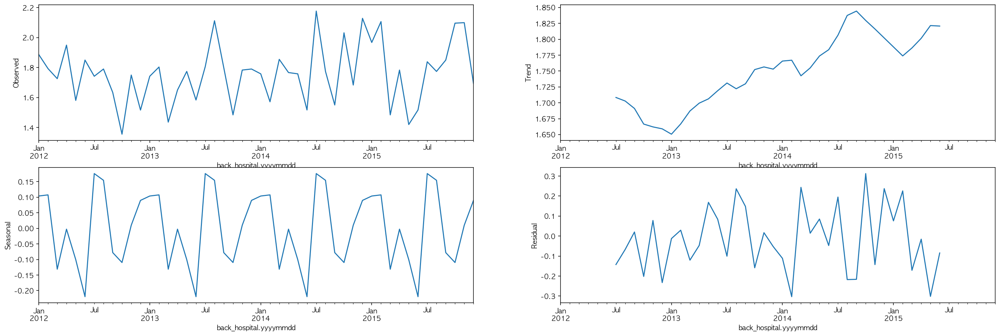

In [ ]:
seasonal_부산 = seasonal_decompose(부산['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_부산)

In [ ]:
부산_corr = pd.DataFrame()

for col in 부산.columns[1:32]:
        부산_corr.loc[col, 'corr'] = stats.pearsonr(부산['back_hospital.frequency'], 부산[col])[0]
        부산_corr.loc[col, 'p_value'] = stats.pearsonr(부산['back_hospital.frequency'], 부산[col])[1]

부산_corr[부산_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
minRhmHrmt,0.313085,0.030255


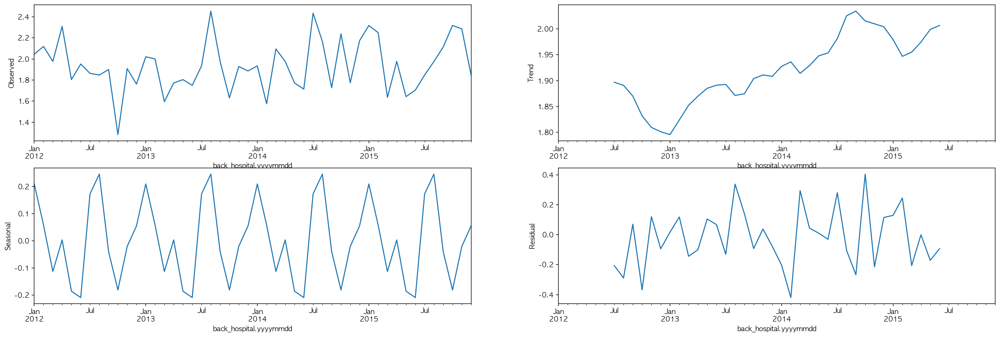

In [ ]:
seasonal_부산_평일 = seasonal_decompose(부산_평일['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_부산_평일)

In [ ]:
부산_평일_corr = pd.DataFrame()

for col in 부산_평일.columns[1:32]:
        부산_평일_corr.loc[col, 'corr'] = stats.pearsonr(부산_평일['back_hospital.frequency'], 부산_평일[col])[0]
        부산_평일_corr.loc[col, 'p_value'] = stats.pearsonr(부산_평일['back_hospital.frequency'], 부산_평일[col])[1]

부산_평일_corr[부산_평일_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
minRhmHrmt,0.347189,0.015618


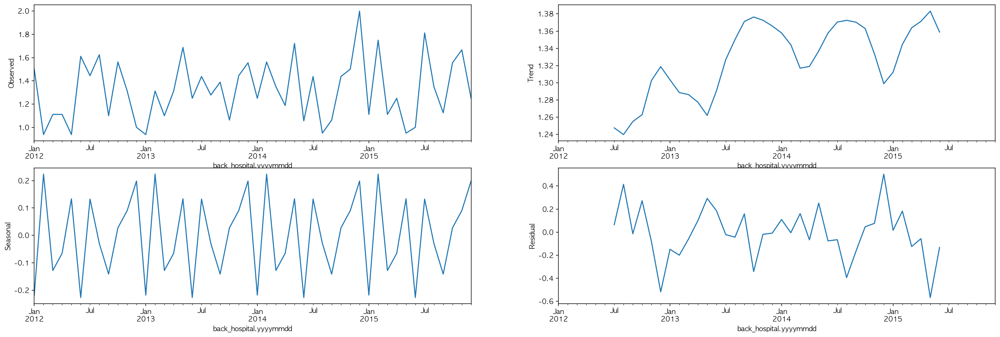

In [ ]:
seasonal_부산_주말 = seasonal_decompose(부산_주말['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_부산_주말)

In [ ]:
부산_주말_corr = pd.DataFrame()

for col in 부산_주말.columns[1:32]:
        부산_주말_corr.loc[col, 'corr'] = stats.pearsonr(부산_주말['back_hospital.frequency'], 부산_주말[col])[0]
        부산_주말_corr.loc[col, 'p_value'] = stats.pearsonr(부산_주말['back_hospital.frequency'], 부산_주말[col])[1]

부산_주말_corr[부산_주말_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
maxInsWsHrmt,0.398013,0.005085
maxWsHrmt,0.293130,0.043178


### 지역 분석 '서울'

In [ ]:
서울 = df_aos[df_aos['back_hospital.area'] == '서울']
서울_주말 = 서울[서울['week'] == '주말']
서울_평일 = 서울[서울['week'] == '평일']

서울 = 서울.resample('M').mean()
서울_주말 = 서울_주말.resample('M').mean()
서울_평일 = 서울_평일.resample('M').mean()
서울.describe()

,back_hospital.sex,back_hospital.frequency,avgTa,minTa,minTaHrmt,maxTa,maxTaHrmt,maxInsWs,maxInsWsWd,maxInsWsHrmt,...,avgPa,maxPs,maxPsHrmt,minPs,minPsHrmt,avgPs,ssDur,sumSsHr,avgTs,minTg
count,48.0,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,...,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,1.5,3.542287,12.904406,8.949307,902.440119,17.637874,1358.750237,8.943095,216.521225,1380.505639,...,1005.847020,1018.739002,1175.837642,1013.598404,1250.900519,1016.129856,12.195998,6.733730,14.643958,5.496714
std,0.0,0.210953,10.439354,10.503863,151.760566,10.540658,73.818303,0.966728,29.387343,99.945715,...,6.544197,7.323491,111.779357,6.719338,117.771861,7.000413,1.782367,1.330410,11.189832,11.087976
min,1.5,3.183333,-4.119355,-7.390323,655.516129,-0.519355,1183.166667,7.386667,147.419355,1127.967742,...,995.338710,1007.074194,939.433333,1003.316129,1006.741935,1005.006452,9.635484,3.258065,-2.270968,-12.493548
25%,1.5,3.350000,4.299885,0.086838,766.056452,8.788393,1308.099462,8.180645,191.916667,1313.916935,...,999.208065,1011.438710,1105.241935,1006.865323,1165.330645,1009.087903,10.651012,6.014597,4.527581,-4.577938
50%,1.5,3.541129,14.655860,10.041935,903.688940,20.069946,1362.516129,8.727419,220.000000,1404.155530,...,1007.013925,1019.914892,1180.006336,1014.389462,1257.161290,1017.432366,12.203602,6.573710,16.220968,5.632097
75%,1.5,3.729839,22.558333,18.264167,1006.174539,27.846667,1415.282258,9.455726,239.032258,1451.850000,...,1011.343203,1024.828831,1257.133871,1019.451325,1340.637931,1022.196054,13.746774,7.693548,25.300833,15.174167
max,1.5,3.935484,27.696774,24.838710,1266.322581,31.087097,1464.833333,11.190000,262.580645,1627.741935,...,1015.316129,1028.929032,1431.633333,1023.912903,1506.300000,1026.377419,14.740000,9.806452,29.746667,22.541935


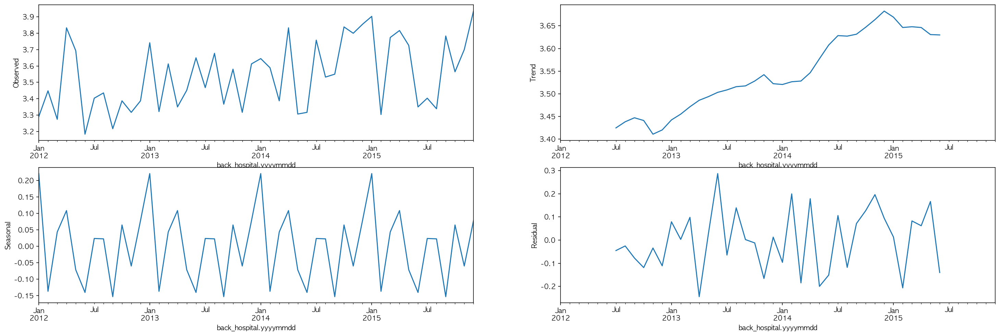

In [ ]:
seasonal_서울 = seasonal_decompose(서울['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_서울)

In [ ]:
서울_corr = pd.DataFrame()

for col in 서울.columns[1:32]:
        서울_corr.loc[col, 'corr'] = stats.pearsonr(서울['back_hospital.frequency'], 서울[col])[0]
        서울_corr.loc[col, 'p_value'] = stats.pearsonr(서울['back_hospital.frequency'], 서울[col])[1]

서울_corr[서울_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.0,0.0


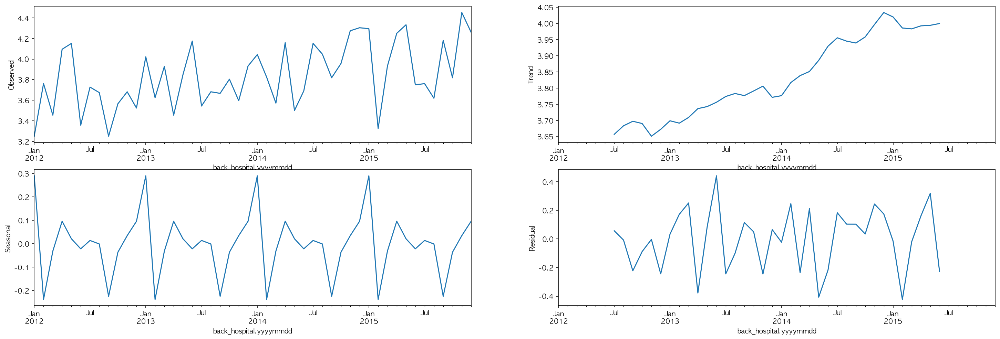

In [ ]:
seasonal_서울_평일 = seasonal_decompose(서울_평일['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_서울_평일)

In [ ]:
서울_평일_corr = pd.DataFrame()

for col in 서울.columns[1:32]:
        서울_평일_corr.loc[col, 'corr'] = stats.pearsonr(서울_평일['back_hospital.frequency'], 서울_평일[col])[0]
        서울_평일_corr.loc[col, 'p_value'] = stats.pearsonr(서울_평일['back_hospital.frequency'], 서울_평일[col])[1]

서울_평일_corr[서울_평일_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.0,0.0


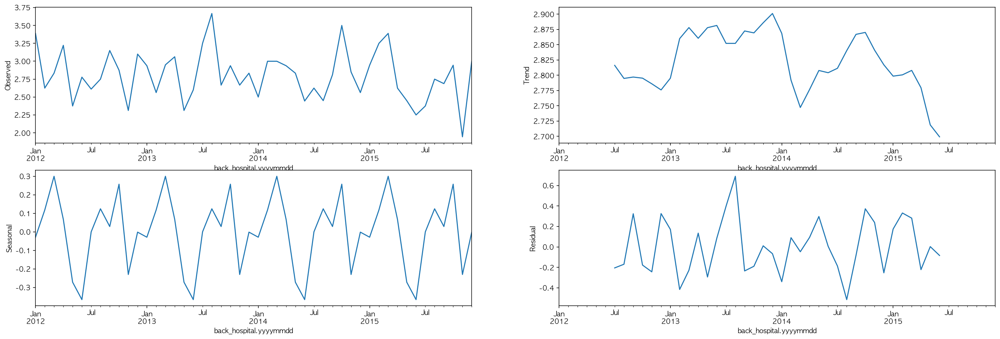

In [ ]:
seasonal_서울_주말 = seasonal_decompose(서울_주말['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_서울_주말)

In [ ]:
서울_주말_corr = pd.DataFrame()

for col in 서울.columns[1:32]:
        서울_주말_corr.loc[col, 'corr'] = stats.pearsonr(서울_주말['back_hospital.frequency'], 서울_주말[col])[0]
        서울_주말_corr.loc[col, 'p_value'] = stats.pearsonr(서울_주말['back_hospital.frequency'], 서울_주말[col])[1]

서울_주말_corr[서울_주말_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
minTaHrmt,0.286945,0.047995


### 지역 분석 '세종'

In [ ]:
세종 = df_aos[df_aos['back_hospital.area'] == '세종']
세종_주말 = 세종[세종['week'] == '주말']
세종_평일 = 세종[세종['week'] == '평일']

세종 = 세종.resample('M').mean()
세종_주말 = 세종_주말.resample('M').mean()
세종_평일 = 세종_평일.resample('M').mean()
세종.describe()

,back_hospital.sex,back_hospital.frequency,avgTa,minTa,minTaHrmt,maxTa,maxTaHrmt,maxInsWs,maxInsWsWd,maxInsWsHrmt,...,avgPa,maxPs,maxPsHrmt,minPs,minPsHrmt,avgPs,ssDur,sumSsHr,avgTs,minTg
count,48.0,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,...,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,1.5,0.056126,12.312129,7.379682,908.881497,17.943127,1344.804497,7.325849,223.592463,1326.231270,...,1010.448097,1018.975763,1177.256511,1013.860440,1243.088450,1016.377038,12.190238,6.090082,14.750829,5.356809
std,0.0,0.036661,9.769763,10.133081,130.249251,9.731636,60.355013,0.842228,25.557307,76.163221,...,6.660888,7.240883,98.828023,6.611676,91.788925,6.914036,1.707731,1.355142,10.541455,10.775056
min,1.5,0.000000,-3.225161,-8.478710,628.413333,1.683226,1158.480000,5.948000,172.516129,1093.470968,...,1000.186452,1007.603871,998.683871,1003.672258,1052.354839,1005.753548,9.732258,2.289333,-0.924516,-10.283226
25%,1.5,0.032258,4.095645,-1.427419,791.993333,9.225467,1323.154839,6.769468,204.535484,1285.886667,...,1003.929677,1011.971129,1116.127419,1007.378065,1187.795484,1009.646290,10.707107,5.128667,5.617419,-4.672742
50%,1.5,0.048387,13.114849,7.107989,902.788172,20.213989,1354.689321,7.195806,228.175269,1341.214516,...,1011.675839,1020.248817,1160.232258,1014.552258,1247.710829,1017.678000,12.198871,5.964667,15.545247,4.547699
75%,1.5,0.080645,20.943167,16.439667,999.663387,27.050167,1388.321452,7.804618,244.300000,1371.174677,...,1016.296838,1025.160351,1220.136075,1019.846907,1299.601325,1022.529700,13.680645,7.124167,24.426871,14.655167
max,1.5,0.142857,26.823226,22.996774,1160.509677,31.695484,1432.960000,9.642000,261.032258,1454.900000,...,1020.086452,1029.103226,1398.638710,1023.956774,1437.660000,1026.450968,14.611333,9.170323,30.494194,22.423871


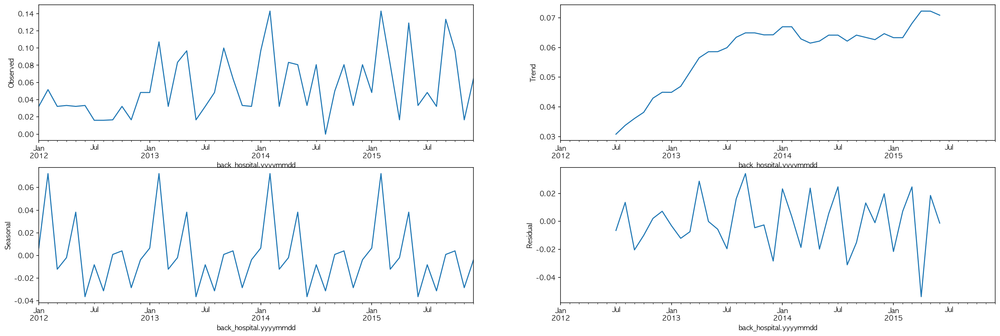

In [ ]:
seasonal_세종 = seasonal_decompose(세종['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_세종)

In [ ]:
세종_corr = pd.DataFrame()

for col in 세종.columns[1:32]:
        세종_corr.loc[col, 'corr'] = stats.pearsonr(세종['back_hospital.frequency'], 세종[col])[0]
        세종_corr.loc[col, 'p_value'] = stats.pearsonr(세종['back_hospital.frequency'], 세종[col])[1]

세종_corr[세종_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
minRhm,-0.339547,0.018223
sumSsHr,0.320369,0.026422
avgRhm,-0.288058,0.047097


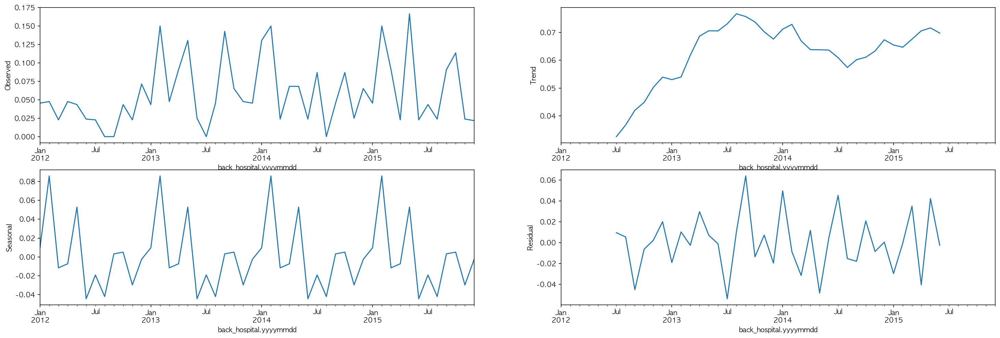

In [ ]:
seasonal_세종_평일 = seasonal_decompose(세종_평일['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_세종_평일)

In [ ]:
세종_평일_corr = pd.DataFrame()

for col in 세종_평일.columns[1:32]:
        세종_평일_corr.loc[col, 'corr'] = stats.pearsonr(세종_평일['back_hospital.frequency'], 세종_평일[col])[0]
        세종_평일_corr.loc[col, 'p_value'] = stats.pearsonr(세종_평일['back_hospital.frequency'], 세종_평일[col])[1]

세종_평일_corr[세종_평일_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
minRhm,-0.443211,0.001606
sumSsHr,0.407218,0.004072
avgRhm,-0.404536,0.004347
avgPv,-0.324931,0.024235
minTg,-0.324863,0.024267
avgTd,-0.307955,0.033222
minTa,-0.298762,0.039142
minPs,0.295281,0.041598
avgPa,0.291025,0.044771


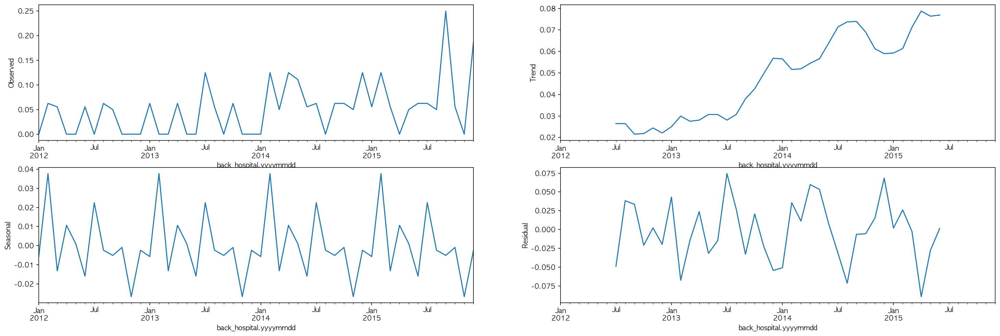

In [ ]:
seasonal_세종_주말 = seasonal_decompose(세종_주말['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_세종_주말)

In [ ]:
세종_주말_corr = pd.DataFrame()

for col in 세종_주말.columns[1:32]:
        세종_주말_corr.loc[col, 'corr'] = stats.pearsonr(세종_주말['back_hospital.frequency'], 세종_주말[col])[0]
        세종_주말_corr.loc[col, 'p_value'] = stats.pearsonr(세종_주말['back_hospital.frequency'], 세종_주말[col])[1]

세종_주말_corr[세종_주말_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.0,0.0


### 지역 분석 '인천'

In [ ]:
인천 = df_aos[df_aos['back_hospital.area'] == '인천']
인천_주말 = 인천[인천['week'] == '주말']
인천_평일 = 인천[인천['week'] == '평일']

인천 = 인천.resample('M').mean()
인천_주말 = 인천_주말.resample('M').mean()
인천_평일 = 인천_평일.resample('M').mean()
인천.describe()

,back_hospital.sex,back_hospital.frequency,avgTa,minTa,minTaHrmt,maxTa,maxTaHrmt,maxInsWs,maxInsWsWd,maxInsWsHrmt,...,avgPa,maxPs,maxPsHrmt,minPs,minPsHrmt,avgPs,ssDur,sumSsHr,avgTs,minTg
count,48.0,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,...,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,1.5,1.040061,11.639085,8.173307,904.254766,15.595488,1307.986257,9.689565,231.563905,1272.354209,...,1005.860387,1018.824574,1169.011443,1013.939132,1196.236024,1016.342920,12.195370,6.566568,14.043950,6.377577
std,0.0,0.132370,9.734167,9.898386,123.759319,9.794316,55.843028,1.212738,23.407860,67.987348,...,6.684363,7.428404,107.663919,6.829412,86.288920,7.101307,1.791329,1.374214,10.578973,10.145094
min,1.5,0.733333,-3.869892,-7.246237,663.466667,-0.445161,1187.822222,7.363333,181.827957,1140.129032,...,994.646237,1006.561290,955.956989,1002.578495,996.483871,1004.477419,9.617204,2.750538,-1.701075,-7.835484
25%,1.5,0.951613,2.831989,-0.876344,829.457738,7.043817,1256.177419,8.856962,217.138889,1226.642473,...,999.140054,1011.508199,1101.865860,1007.294355,1147.109140,1009.358602,10.639365,5.836156,4.431855,-3.226075
50%,1.5,1.048387,13.134570,9.191039,901.552867,17.683423,1307.949885,9.512724,234.374552,1265.614337,...,1007.225376,1020.022437,1166.751920,1015.080197,1199.096774,1017.864839,12.201953,6.553452,15.673817,6.468351
75%,1.5,1.145161,20.829167,17.406111,1008.722939,24.997778,1354.876971,10.430496,248.642937,1319.857143,...,1011.419182,1024.882306,1231.158602,1019.909015,1254.602151,1022.384111,13.755914,7.375000,25.245376,15.999167
max,1.5,1.322581,25.986022,23.336559,1173.744444,29.203226,1405.580645,12.164444,280.860215,1408.064516,...,1015.512903,1029.069892,1408.720430,1024.482796,1414.177778,1026.625806,14.741111,9.127957,28.286022,22.770968


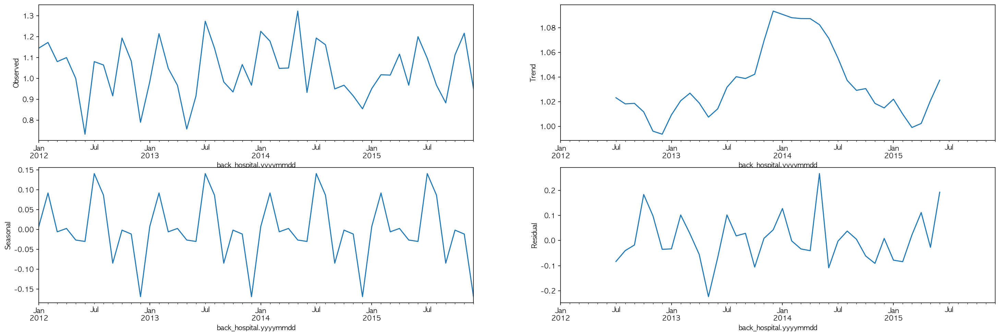

In [ ]:
seasonal_인천 = seasonal_decompose(인천['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_인천)

In [ ]:
인천_corr = pd.DataFrame()

for col in 인천.columns[1:32]:
        인천_corr.loc[col, 'corr'] = stats.pearsonr(인천['back_hospital.frequency'], 인천[col])[0]
        인천_corr.loc[col, 'p_value'] = stats.pearsonr(인천['back_hospital.frequency'], 인천[col])[1]

인천_corr[인천_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.0,0.0


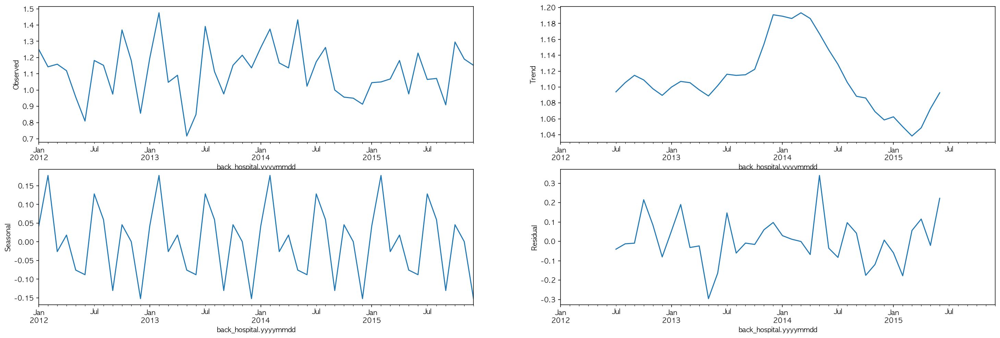

In [ ]:
seasonal_인천_평일 = seasonal_decompose(인천_평일['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_인천_평일)

In [ ]:
인천_평일_corr = pd.DataFrame()

for col in 인천_평일.columns[1:32]:
        인천_평일_corr.loc[col, 'corr'] = stats.pearsonr(인천_평일['back_hospital.frequency'], 인천_평일[col])[0]
        인천_평일_corr.loc[col, 'p_value'] = stats.pearsonr(인천_평일['back_hospital.frequency'], 인천_평일[col])[1]

인천_평일_corr[인천_평일_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.00000
maxWd,0.285105,0.04951


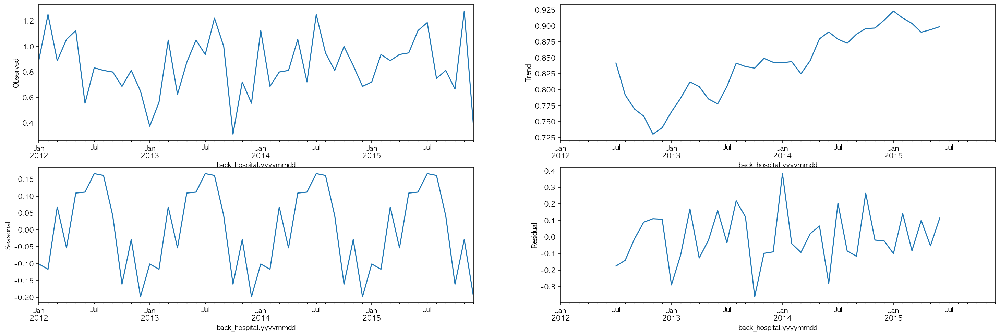

In [ ]:
seasonal_인천_주말 = seasonal_decompose(인천_주말['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_인천_주말)

In [ ]:
인천_주말_corr = pd.DataFrame()

for col in 인천_주말.columns[1:32]:
        인천_주말_corr.loc[col, 'corr'] = stats.pearsonr(인천_주말['back_hospital.frequency'], 인천_주말[col])[0]
        인천_주말_corr.loc[col, 'p_value'] = stats.pearsonr(인천_주말['back_hospital.frequency'], 인천_주말[col])[1]

인천_주말_corr[인천_주말_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
ssDur,0.379438,0.007819
minPs,-0.341786,0.017424
avgPa,-0.334862,0.019995
avgPs,-0.333022,0.020729
maxPs,-0.323417,0.024944
minTg,0.301353,0.037392
minTa,0.291982,0.044040
avgTs,0.290677,0.045039
avgTa,0.285235,0.049401


### 지역 분석 '전남'

In [ ]:
전남 = df_aos[df_aos['back_hospital.area'] == '전남']
전남_주말 = 전남[전남['week'] == '주말']
전남_평일 = 전남[전남['week'] == '평일']

전남 = 전남.resample('M').mean()
전남_주말 = 전남_주말.resample('M').mean()
전남_평일 = 전남_평일.resample('M').mean()
전남.describe()

,back_hospital.sex,back_hospital.frequency,avgTa,minTa,minTaHrmt,maxTa,maxTaHrmt,maxInsWs,maxInsWsWd,maxInsWsHrmt,...,avgPa,maxPs,maxPsHrmt,minPs,minPsHrmt,avgPs,ssDur,sumSsHr,avgTs,minTg
count,48.0,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,...,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,1.5,1.550585,13.949596,9.854232,941.054980,18.667610,1308.673701,9.463939,225.456354,1274.605018,...,1011.226158,1018.701903,1217.691012,1013.842211,1206.207785,1016.208254,12.185260,6.131287,15.939303,7.801915
std,0.0,0.180545,8.566037,8.971266,141.546837,8.437980,44.672370,1.337726,32.631921,52.956889,...,6.340571,6.838560,95.189292,6.237421,80.835851,6.527145,1.602160,1.280932,9.691351,9.598566
min,1.5,1.209677,0.923511,-3.079472,636.936364,5.223511,1179.932551,7.109091,161.173021,1142.853372,...,1001.678299,1008.229091,1036.519062,1004.240469,1068.011730,1006.398827,9.880645,3.253939,1.224927,-6.714370
25%,1.5,1.402419,6.338636,1.961510,809.208138,10.715909,1285.640206,8.552661,201.956169,1236.387537,...,1005.028886,1012.119721,1150.765103,1007.734824,1135.635508,1009.864062,10.794161,5.257753,7.523314,-0.489443
50%,1.5,1.565591,14.793275,9.810587,955.510606,20.480606,1309.828690,9.179242,222.775660,1273.531427,...,1012.349516,1019.855870,1219.947266,1014.444687,1214.492669,1017.399966,12.192405,5.845093,16.969878,7.567683
75%,1.5,1.678898,21.759394,18.090455,1032.554885,26.232348,1345.745674,10.630037,250.262463,1313.752346,...,1017.129695,1024.817586,1276.636144,1019.871429,1270.667082,1022.357088,13.584164,7.189971,24.710909,16.668636
max,1.5,1.887097,27.615718,24.170381,1206.988270,32.265103,1378.563050,11.821212,284.926686,1388.953079,...,1020.395015,1028.175367,1399.782991,1023.312610,1361.914956,1025.675953,14.463333,9.185337,31.836305,23.310557


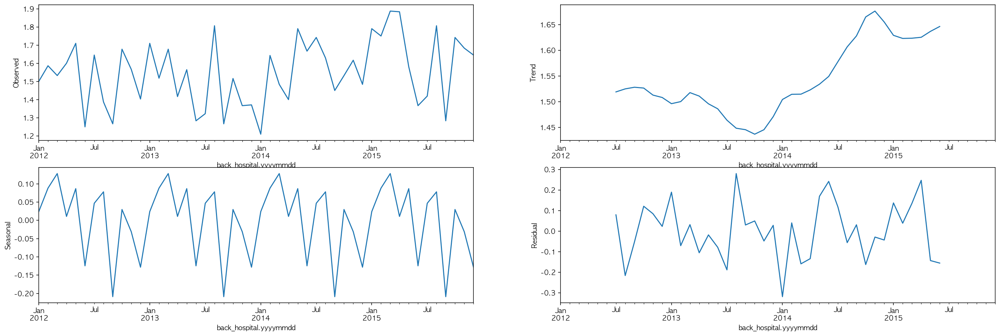

In [ ]:
seasonal_전남 = seasonal_decompose(전남['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_전남)

In [ ]:
전남_corr = pd.DataFrame()

for col in 전남.columns[1:32]:
        전남_corr.loc[col, 'corr'] = stats.pearsonr(전남['back_hospital.frequency'], 전남[col])[0]
        전남_corr.loc[col, 'p_value'] = stats.pearsonr(전남['back_hospital.frequency'], 전남[col])[1]

전남_corr[전남_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.0,0.0


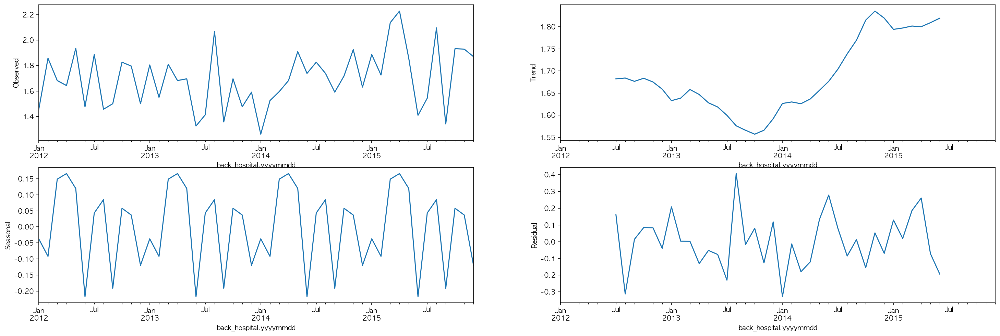

In [ ]:
seasonal_전남_평일 = seasonal_decompose(전남_평일['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_전남_평일)

In [ ]:
전남_평일_corr = pd.DataFrame()

for col in 전남_평일.columns[1:32]:
        전남_평일_corr.loc[col, 'corr'] = stats.pearsonr(전남_평일['back_hospital.frequency'], 전남_평일[col])[0]
        전남_평일_corr.loc[col, 'p_value'] = stats.pearsonr(전남_평일['back_hospital.frequency'], 전남_평일[col])[1]

전남_평일_corr[전남_평일_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.00000
maxWsHrmt,0.285141,0.04948


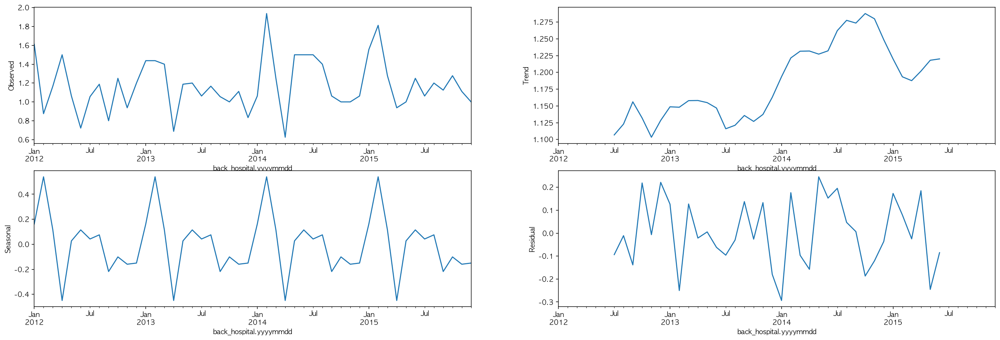

In [ ]:
seasonal_전남_주말 = seasonal_decompose(전남_주말['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_전남_주말)

In [ ]:
전남_주말_corr = pd.DataFrame()

for col in 전남_주말.columns[1:32]:
        전남_주말_corr.loc[col, 'corr'] = stats.pearsonr(전남_주말['back_hospital.frequency'], 전남_주말[col])[0]
        전남_주말_corr.loc[col, 'p_value'] = stats.pearsonr(전남_주말['back_hospital.frequency'], 전남_주말[col])[1]

전남_주말_corr[전남_주말_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.0,0.0


### 지역 분석 '전북'

In [ ]:
전북 = df_aos[df_aos['back_hospital.area'] == '전북']
전북_주말 = 전북[전북['week'] == '주말']
전북_평일 = 전북[전북['week'] == '평일']

전북 = 전북.resample('M').mean()
전북_주말 = 전북_주말.resample('M').mean()
전북_평일 = 전북_평일.resample('M').mean()
전북.describe()

,back_hospital.sex,back_hospital.frequency,avgTa,minTa,minTaHrmt,maxTa,maxTaHrmt,maxInsWs,maxInsWsWd,maxInsWsHrmt,...,avgPa,maxPs,maxPsHrmt,minPs,minPsHrmt,avgPs,ssDur,sumSsHr,avgTs,minTg
count,48.0,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,...,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,1.5,1.303816,12.756832,7.832073,936.732683,18.468306,1338.404319,7.847556,238.426082,1360.567574,...,1002.333869,1019.093913,1194.199143,1013.783230,1271.117029,1016.399372,12.187450,5.815784,15.073211,5.726513
std,0.0,0.152217,9.441391,9.786265,128.878646,9.443940,58.568317,0.887032,20.366022,58.294043,...,6.238614,7.138906,99.304361,6.519435,97.921429,6.827742,1.650940,1.374221,10.175342,10.340000
min,1.5,1.016667,-2.111437,-7.235777,686.221212,3.121408,1191.500000,6.292727,180.322581,1184.049853,...,992.738485,1008.158182,1022.334311,1003.812903,1050.258065,1006.136070,9.814076,2.281515,-0.215836,-9.304985
25%,1.5,1.203091,4.730477,-0.608431,827.762537,9.901032,1299.948680,7.171481,222.362903,1334.014394,...,996.101466,1012.273167,1138.424487,1007.332551,1212.730010,1009.775806,10.754729,4.914106,6.102529,-3.598167
50%,1.5,1.278763,13.363147,7.419643,946.960606,20.471266,1360.922727,7.714956,240.979472,1361.133431,...,1003.468729,1020.432302,1182.331378,1014.323837,1268.402964,1017.646548,12.193363,5.607554,15.844992,5.026515
75%,1.5,1.400000,21.142197,16.569394,1046.293939,26.806288,1379.050806,8.480975,255.146628,1399.731745,...,1007.768944,1025.288541,1230.612610,1019.884999,1335.231672,1022.698391,13.628666,6.976518,24.189621,15.182803
max,1.5,1.666667,27.143695,23.313490,1171.155425,32.381232,1437.375367,10.236667,273.870968,1461.687879,...,1011.668915,1029.128446,1427.184751,1023.887683,1464.027273,1026.450733,14.532121,9.114076,30.596188,22.572141


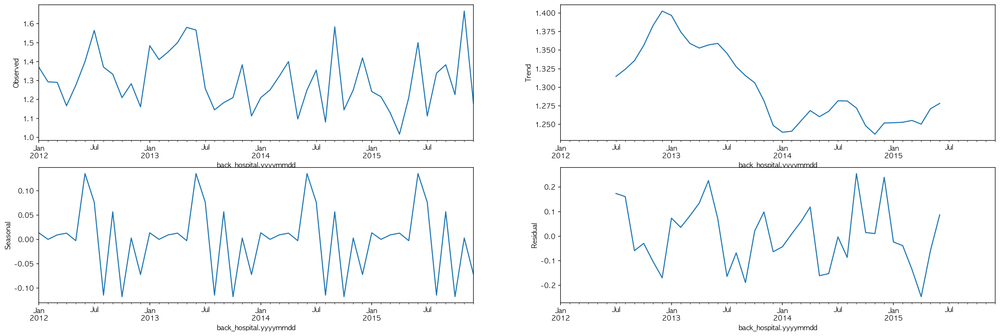

In [ ]:
seasonal_전북 = seasonal_decompose(전북['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_전북)

In [ ]:
전북_corr = pd.DataFrame()

for col in 전북.columns[1:32]:
        전북_corr.loc[col, 'corr'] = stats.pearsonr(전북['back_hospital.frequency'], 전북[col])[0]
        전북_corr.loc[col, 'p_value'] = stats.pearsonr(전북['back_hospital.frequency'], 전북[col])[1]

전북_corr[전북_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.0,0.0


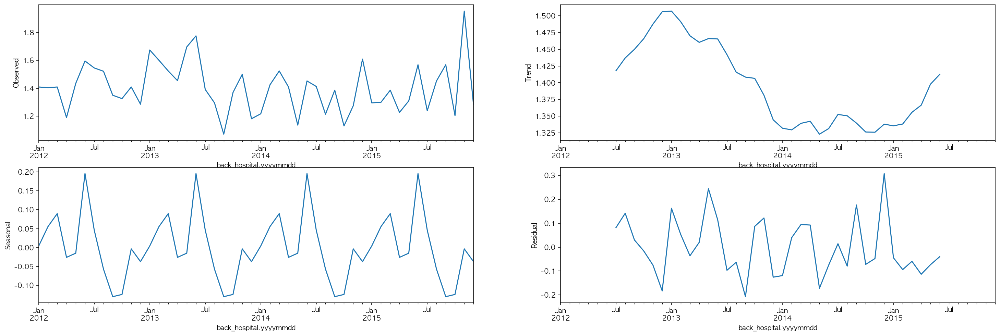

In [ ]:
seasonal_전북_평일 = seasonal_decompose(전북_평일['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_전북_평일)

In [ ]:
전북_평일_corr = pd.DataFrame()

for col in 전북_평일.columns[1:32]:
        전북_평일_corr.loc[col, 'corr'] = stats.pearsonr(전북_평일['back_hospital.frequency'], 전북_평일[col])[0]
        전북_평일_corr.loc[col, 'p_value'] = stats.pearsonr(전북_평일['back_hospital.frequency'], 전북_평일[col])[1]

전북_평일_corr[전북_평일_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
maxTaHrmt,-0.299204,0.038838


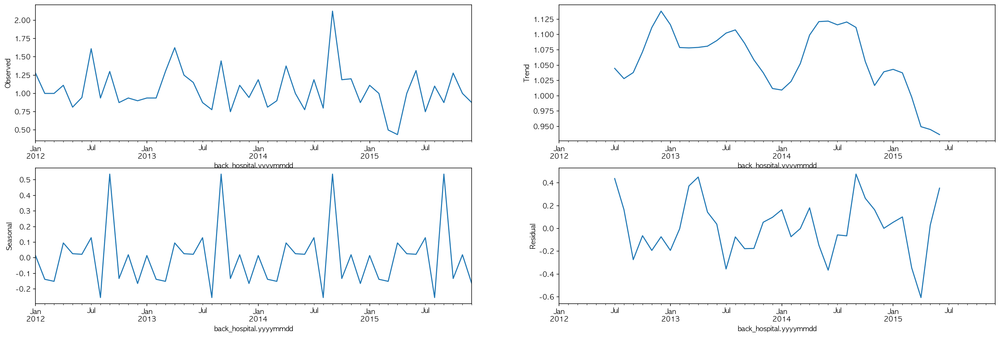

In [ ]:
seasonal_전북_주말 = seasonal_decompose(전북_주말['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_전북_주말)

In [ ]:
전북_주말_corr = pd.DataFrame()

for col in 전북_주말.columns[1:32]:
        전북_주말_corr.loc[col, 'corr'] = stats.pearsonr(전북_주말['back_hospital.frequency'], 전북_주말[col])[0]
        전북_주말_corr.loc[col, 'p_value'] = stats.pearsonr(전북_주말['back_hospital.frequency'], 전북_주말[col])[1]

전북_주말_corr[전북_주말_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.0,0.0


### 지역 분석 '제주'

In [ ]:
제주 = df_aos[df_aos['back_hospital.area'] == '제주']
제주_주말 = 제주[제주['week'] == '주말']
제주_평일 = 제주[제주['week'] == '평일']

제주 = 제주.resample('M').mean()
제주_주말 = 제주_주말.resample('M').mean()
제주_평일 = 제주_평일.resample('M').mean()
제주.describe()

,back_hospital.sex,back_hospital.frequency,avgTa,minTa,minTaHrmt,maxTa,maxTaHrmt,maxInsWs,maxInsWsWd,maxInsWsHrmt,...,avgPa,maxPs,maxPsHrmt,minPs,minPsHrmt,avgPs,ssDur,sumSsHr,avgTs,minTg
count,48.0,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,...,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,1.5,0.272363,16.102758,13.200585,966.947004,19.334141,1235.520155,10.898246,197.934063,1196.590099,...,1011.066646,1018.239717,1226.815178,1013.502066,1132.111445,1015.846399,12.181339,5.617322,17.813154,12.052413
std,0.0,0.069629,7.163674,7.456298,142.325497,7.110552,68.996046,1.481816,35.616479,60.891329,...,6.176012,6.605776,97.873298,6.069679,72.722906,6.325241,1.518558,1.521792,8.737694,7.688980
min,1.5,0.112903,5.410345,2.600862,724.145161,8.305172,1019.209677,8.506667,132.833333,1004.358333,...,1001.840000,1008.202500,1017.193548,1004.414516,986.524194,1006.480833,10.008065,2.846505,4.454839,1.386290
25%,1.5,0.225806,9.646371,6.328629,853.537500,12.639516,1200.484879,9.737083,174.233871,1170.634073,...,1005.250000,1012.022285,1151.443896,1007.905040,1074.429435,1009.932258,10.861592,4.459792,10.156310,4.917540
50%,1.5,0.274194,16.542823,13.534677,981.574713,20.229422,1230.368145,10.696667,194.919355,1196.790323,...,1012.336546,1019.367379,1226.331365,1014.515282,1131.898387,1017.190672,12.189167,5.701116,18.883804,12.274368
75%,1.5,0.325269,22.102500,19.708958,1065.259073,25.068750,1286.596774,11.915580,226.058908,1236.344355,...,1017.042702,1024.274274,1276.221774,1019.578629,1177.358482,1021.904133,13.502823,6.773730,25.008958,18.823958
max,1.5,0.400000,28.547581,25.760484,1243.653226,31.854032,1364.943548,14.578226,278.064516,1352.322581,...,1019.930645,1027.366935,1440.088710,1022.758065,1263.935484,1024.951613,14.345000,8.811290,33.854032,25.195161


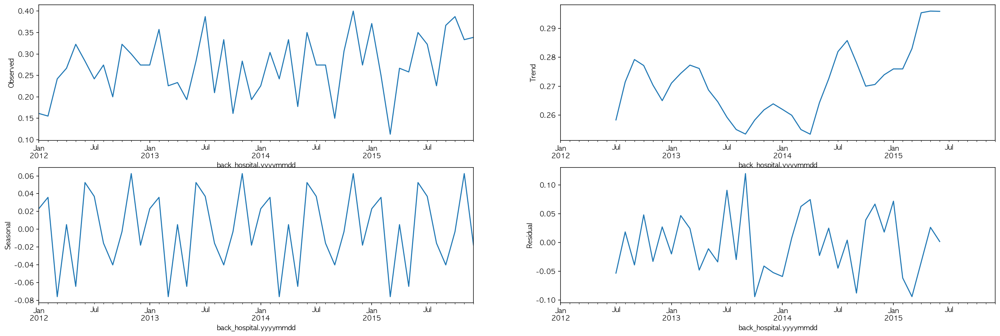

In [ ]:
seasonal_제주 = seasonal_decompose(제주['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_제주)

In [ ]:
제주_corr = pd.DataFrame()

for col in 제주.columns[1:32]:
        제주_corr.loc[col, 'corr'] = stats.pearsonr(제주['back_hospital.frequency'], 제주[col])[0]
        제주_corr.loc[col, 'p_value'] = stats.pearsonr(제주['back_hospital.frequency'], 제주[col])[1]

제주_corr[제주_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.0,0.0


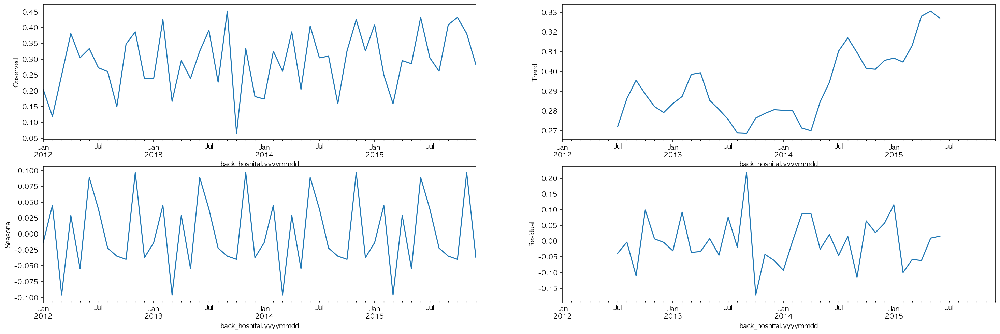

In [ ]:
seasonal_제주_평일 = seasonal_decompose(제주_평일['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_제주_평일)

In [ ]:
제주_평일_corr = pd.DataFrame()

for col in 제주_평일.columns[1:32]:
        제주_평일_corr.loc[col, 'corr'] = stats.pearsonr(제주_평일['back_hospital.frequency'], 제주_평일[col])[0]
        제주_평일_corr.loc[col, 'p_value'] = stats.pearsonr(제주_평일['back_hospital.frequency'], 제주_평일[col])[1]

제주_평일_corr[제주_평일_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.0,0.0


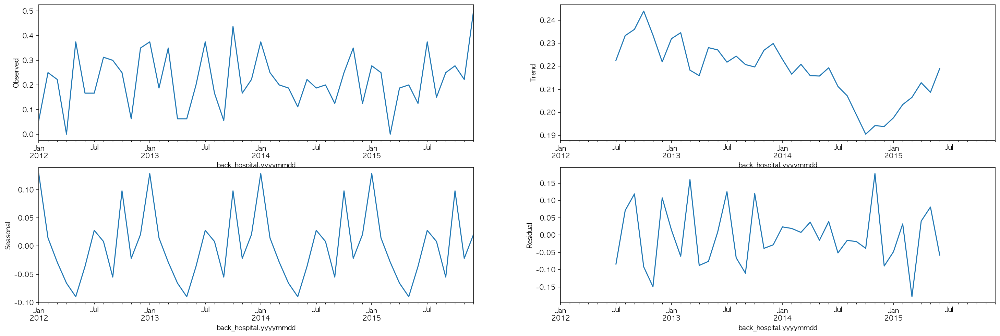

In [ ]:
seasonal_제주_주말 = seasonal_decompose(제주_주말['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_제주_주말)

In [ ]:
제주_주말_corr = pd.DataFrame()

for col in 제주_주말.columns[1:32]:
        제주_주말_corr.loc[col, 'corr'] = stats.pearsonr(제주_주말['back_hospital.frequency'], 제주_주말[col])[0]
        제주_주말_corr.loc[col, 'p_value'] = stats.pearsonr(제주_주말['back_hospital.frequency'], 제주_주말[col])[1]

제주_주말_corr[제주_주말_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.0,0.0


### 지역 분석 '충남'

In [ ]:
충남 = df_aos[df_aos['back_hospital.area'] == '충남']
충남_주말 = 충남[충남['week'] == '주말']
충남_평일 = 충남[충남['week'] == '평일']

충남 = 충남.resample('M').mean()
충남_주말 = 충남_주말.resample('M').mean()
충남_평일 = 충남_평일.resample('M').mean()
충남.describe()

,back_hospital.sex,back_hospital.frequency,avgTa,minTa,minTaHrmt,maxTa,maxTaHrmt,maxInsWs,maxInsWsWd,maxInsWsHrmt,...,avgPa,maxPs,maxPsHrmt,minPs,minPsHrmt,avgPs,ssDur,sumSsHr,avgTs,minTg
count,48.0,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,...,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,1.5,1.093978,12.312129,7.379682,908.881497,17.943127,1344.804497,7.325849,223.592463,1326.231270,...,1010.448097,1018.975763,1177.256511,1013.860440,1243.088450,1016.377038,12.190238,6.090082,14.750829,5.356809
std,0.0,0.107119,9.769763,10.133081,130.249251,9.731636,60.355013,0.842228,25.557307,76.163221,...,6.660888,7.240883,98.828023,6.611676,91.788925,6.914036,1.707731,1.355142,10.541455,10.775056
min,1.5,0.838710,-3.225161,-8.478710,628.413333,1.683226,1158.480000,5.948000,172.516129,1093.470968,...,1000.186452,1007.603871,998.683871,1003.672258,1052.354839,1005.753548,9.732258,2.289333,-0.924516,-10.283226
25%,1.5,1.000000,4.095645,-1.427419,791.993333,9.225467,1323.154839,6.769468,204.535484,1285.886667,...,1003.929677,1011.971129,1116.127419,1007.378065,1187.795484,1009.646290,10.707107,5.128667,5.617419,-4.672742
50%,1.5,1.086310,13.114849,7.107989,902.788172,20.213989,1354.689321,7.195806,228.175269,1341.214516,...,1011.675839,1020.248817,1160.232258,1014.552258,1247.710829,1017.678000,12.198871,5.964667,15.545247,4.547699
75%,1.5,1.162634,20.943167,16.439667,999.663387,27.050167,1388.321452,7.804618,244.300000,1371.174677,...,1016.296838,1025.160351,1220.136075,1019.846907,1299.601325,1022.529700,13.680645,7.124167,24.426871,14.655167
max,1.5,1.333333,26.823226,22.996774,1160.509677,31.695484,1432.960000,9.642000,261.032258,1454.900000,...,1020.086452,1029.103226,1398.638710,1023.956774,1437.660000,1026.450968,14.611333,9.170323,30.494194,22.423871


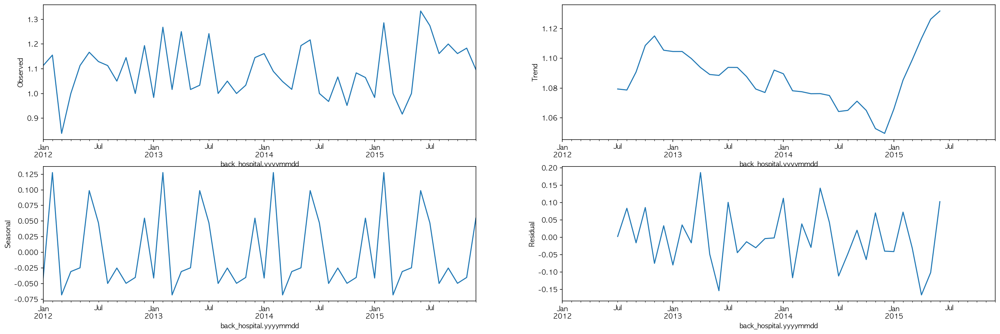

In [ ]:
seasonal_충남 = seasonal_decompose(충남['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_충남)

In [ ]:
충남_corr = pd.DataFrame()

for col in 충남.columns[1:32]:
        충남_corr.loc[col, 'corr'] = stats.pearsonr(충남['back_hospital.frequency'], 충남[col])[0]
        충남_corr.loc[col, 'p_value'] = stats.pearsonr(충남['back_hospital.frequency'], 충남[col])[1]

충남_corr[충남_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.0,0.0


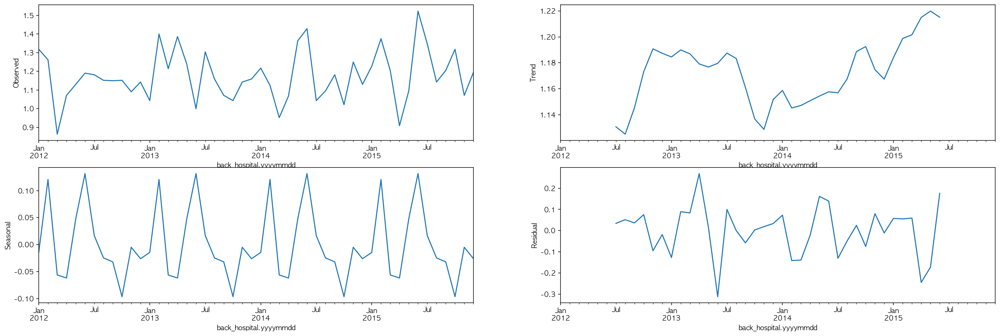

In [ ]:
seasonal_충남_평일 = seasonal_decompose(충남_평일['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_충남_평일)

In [ ]:
충남_평일_corr = pd.DataFrame()

for col in 충남_평일.columns[1:32]:
        충남_평일_corr.loc[col, 'corr'] = stats.pearsonr(충남_평일['back_hospital.frequency'], 충남_평일[col])[0]
        충남_평일_corr.loc[col, 'p_value'] = stats.pearsonr(충남_평일['back_hospital.frequency'], 충남_평일[col])[1]

충남_평일_corr[충남_평일_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.0,0.0


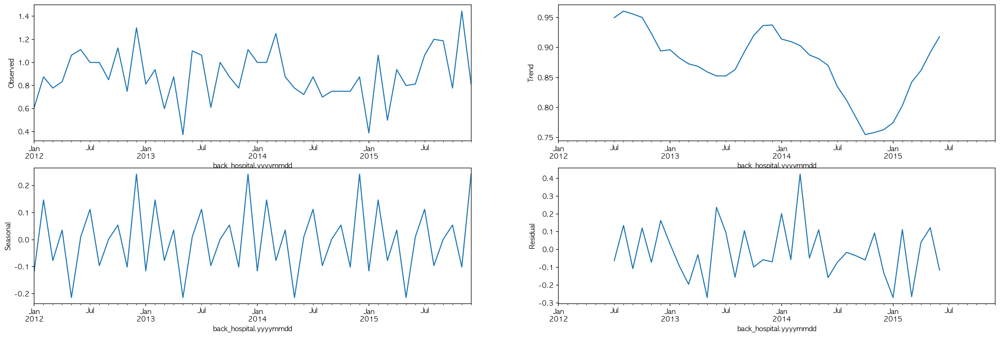

In [ ]:
seasonal_충남_주말 = seasonal_decompose(충남_주말['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_충남_주말)

In [ ]:
충남_주말_corr = pd.DataFrame()

for col in 충남_주말.columns[1:32]:
        충남_주말_corr.loc[col, 'corr'] = stats.pearsonr(충남_주말['back_hospital.frequency'], 충남_주말[col])[0]
        충남_주말_corr.loc[col, 'p_value'] = stats.pearsonr(충남_주말['back_hospital.frequency'], 충남_주말[col])[1]

충남_주말_corr[충남_주말_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
sumSsHr,-0.359963,0.011970
minRhm,0.355344,0.013194
avgRhm,0.317458,0.027902


### 지역 분석 '충북'

In [ ]:
충북 = df_aos[df_aos['back_hospital.area'] == '충북']
충북_주말 = 충북[충북['week'] == '주말']
충북_평일 = 충북[충북['week'] == '평일']

충북 = 충북.resample('M').mean()
충북_주말 = 충북_주말.resample('M').mean()
충북_평일 = 충북_평일.resample('M').mean()
충북.describe()

,back_hospital.sex,back_hospital.frequency,avgTa,minTa,minTaHrmt,maxTa,maxTaHrmt,maxInsWs,maxInsWsWd,maxInsWsHrmt,...,avgPa,maxPs,maxPsHrmt,minPs,minPsHrmt,avgPs,ssDur,sumSsHr,avgTs,minTg
count,48.0,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,...,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,1.5,0.990440,11.775666,6.553361,896.419884,17.681218,1395.721332,7.539438,224.880518,1367.333876,...,995.998169,1019.337773,1178.595521,1013.605265,1324.068677,1016.454744,12.191507,6.074637,13.801205,5.058152
std,0.0,0.144166,10.082823,10.366959,132.746839,10.122528,64.727019,0.884432,29.306030,59.630794,...,5.984186,7.204306,101.537720,6.572566,120.005320,6.866954,1.724501,1.370382,10.616131,10.725554
min,1.5,0.666667,-4.620000,-9.952258,671.140000,0.532903,1182.246667,5.815333,162.903226,1147.832258,...,986.662581,1007.844516,992.296774,1003.886452,1061.386667,1005.829032,9.709032,2.282000,-1.682581,-10.382581
25%,1.5,0.903226,3.727435,-1.984839,784.593333,9.121929,1359.697414,6.884447,198.648387,1328.289355,...,989.845806,1012.314194,1104.450484,1006.629516,1238.580645,1009.495323,10.695810,5.191167,4.494435,-4.456561
50%,1.5,0.974942,12.676581,6.199882,882.694839,19.995871,1407.422581,7.310323,231.209677,1380.714839,...,996.758172,1020.748548,1170.980323,1013.791688,1312.006106,1017.432108,12.198581,5.795357,14.544989,4.049667
75%,1.5,1.064516,20.386000,15.659333,1020.056183,26.538371,1446.874194,8.151190,249.657397,1407.240887,...,1000.997036,1025.411601,1242.659677,1019.465755,1419.250323,1022.459798,13.696532,7.033871,23.293984,14.516833
max,1.5,1.322581,26.257419,22.580645,1140.580645,31.596129,1498.141935,9.851333,273.806452,1478.870968,...,1004.649677,1029.453548,1445.987097,1023.810323,1550.286667,1026.641290,14.638000,9.428387,29.336774,22.430323


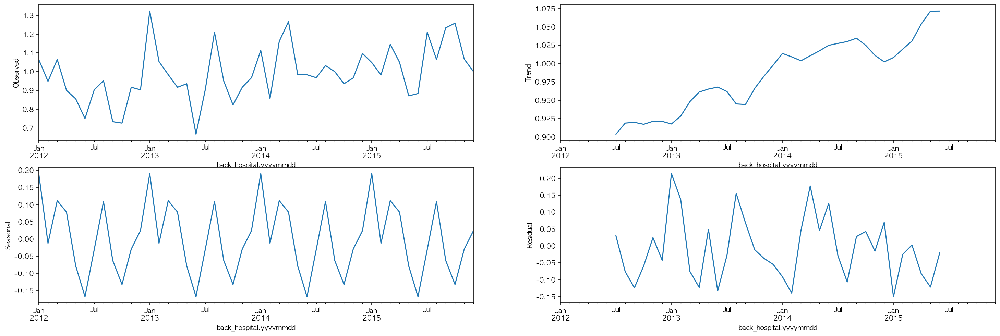

In [ ]:
seasonal_충북 = seasonal_decompose(충북['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_충북)

In [ ]:
충북_corr = pd.DataFrame()

for col in 충북.columns[1:32]:
        충북_corr.loc[col, 'corr'] = stats.pearsonr(충북['back_hospital.frequency'], 충북[col])[0]
        충북_corr.loc[col, 'p_value'] = stats.pearsonr(충북['back_hospital.frequency'], 충북[col])[1]

충북_corr[충북_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.0,0.0


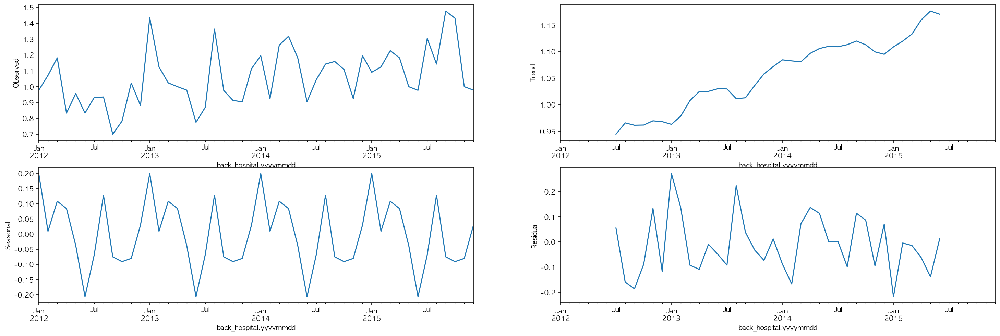

In [ ]:
seasonal_충북_평일 = seasonal_decompose(충북_평일['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_충북_평일)

In [ ]:
충북_평일_corr = pd.DataFrame()

for col in 충북_평일.columns[1:32]:
        충북_평일_corr.loc[col, 'corr'] = stats.pearsonr(충북_평일['back_hospital.frequency'], 충북_평일[col])[0]
        충북_평일_corr.loc[col, 'p_value'] = stats.pearsonr(충북_평일['back_hospital.frequency'], 충북_평일[col])[1]

충북_평일_corr[충북_평일_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.0,0.0


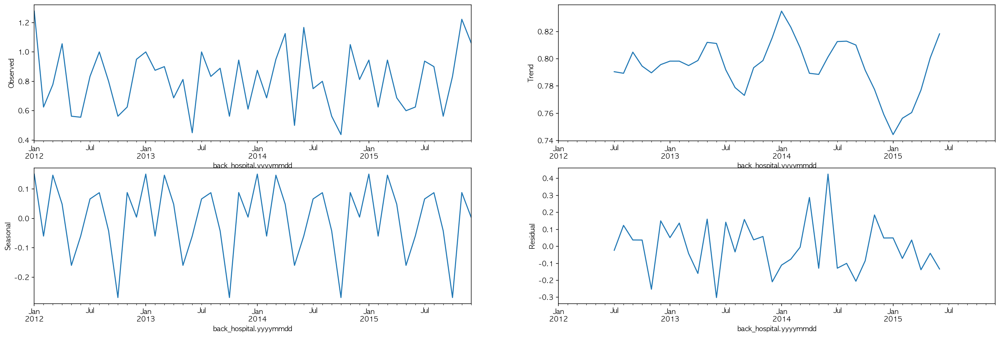

In [ ]:
seasonal_충북_주말 = seasonal_decompose(충북_주말['back_hospital.frequency'], model='additive')
plot_decompose(seasonal_충북_주말)

In [ ]:
충북_주말_corr = pd.DataFrame()

for col in 충북_주말.columns[1:32]:
        충북_주말_corr.loc[col, 'corr'] = stats.pearsonr(충북_주말['back_hospital.frequency'], 충북_주말[col])[0]
        충북_주말_corr.loc[col, 'p_value'] = stats.pearsonr(충북_주말['back_hospital.frequency'], 충북_주말[col])[1]

충북_주말_corr[충북_주말_corr['p_value'] < 0.05].sort_values(by='p_value')

,corr,p_value
back_hospital.frequency,1.000000,0.000000
sumSsHr,-0.445893,0.001492


        전 지역의 때는 입원 환자수의 년도별 추세나, 트렌드를 띄고 있지만,
        시도별로 나누어 확인 하였을 때는 일정한 추세나, 트렌드를 띈다고 보기 어려운 지역도 존재 했다.
        
        전 지역의 심뇌혈관 질환으로 인환 월별 입원 환자수와 기상요인의 피어슨 상관계수를 구했을 때, 
        온도, 습도, 기압, 바람 등의 기상요소가 상관관계가 있다고 확인 되었다.
        심뇌혈관 질환 입원 환자수와, 기상요소는 굉장히 밀잡한 관계가 있지만, 그 영향은 굉장히 미미 하다는 것을 확인 할 수 있다.
        떄문에 지역간의 변동성에도 상관계수 수치에 크게 영향을 받아, 일정한 결과를 내지 않은 것으로 유추 할 수 있다.
        또한 상관관계가 있다고 확인된 기상요소는 모두 기온이 낮아지면, 입원환자 수가 증가 하는 쪽으로 방향을 가르키고 있다.
        때문에 기온과 상관 관계가 있다고 판단 할 수는 있지만, 다른 기상요인이 심뇌혈관 질환에 어떠한 영향을 주는지 파악하기는 어렵다.
        
        지역별 인구 대비 입원환자수에서, 상대적으로 입원환자수가 많은 지역과, 적은 지역의 기온을 비교 했을 때,
        기온의 영향을 받아 입원환자수의 차이를 보였다고, 보기는 어려웠다.
        분석내용에 의하면, 기온이 낮은 경우 입원 환자가 증가 해야 하지만, 오히려 입원 환자수가 적은 지역의 기온이 더 낮은 경우가 있었기 때문.
        
        심뇌혈관 질환에 기상적 요인이 영향을 주지 않는다고 할 수는 없지만, 
        지역간 기상요인의 차이와 심뇌혈관 입원환자 수를 관련지어 설명 할 수 있을만큼 영향이 크지 않다.
        (기온이 낮아지면 심뇌혈관 질환에 좋지 않은 영향을 준다는 결과가 나왔지만, 이 결과를 토대로는 에스키모인들은 심뇌혈관질환에 취약해야함
        하지만 모순되게도 오히려 에스키모인들은 식습관 때문에 심뇌혈관질환에 강하다고 하다.)
        
        '지역 인구수 대비 지역별 입원 환자 비율' 지도와 가장 흡사한 형태를 띄는 요인은 기온이 아니라 '지역별 1인당 개인소득'이다.